# Figure out a way to Unite Data

In [1]:
# setwd("/data/park_lab/adam/unite")
# save.image(file = "unite.RData")

In [2]:
setwd("/data/park_lab/adam/unite")
load(file = "unite.RData")
ls()



Registered S3 method overwritten by 'ggtree':
  method      from 
  identify.gg ggfun



[1] "all_diff_genes"                           
  [2] "AREG_exp"                                 
  [3] "AREG_exp_raw"                             
  [4] "ATAC_E545K_genes"                         
  [5] "ATAC_H1047R_genes"                        
  [6] "ATAC_peak_counts"                         
  [7] "ATAC_peak_counts_reduced"                 
  [8] "ATACPeaks_cleaned"                        
  [9] "ATACPeaks_sorted"                         
 [10] "better_names"                             
 [11] "cancer_coldata"                           
 [12] "cancer_counts"                            
 [13] "cancer_dds"                               
 [14] "cancer_dds_f"                             
 [15] "cancer_diff_genes"                        
 [16] "cancer_E545K_enr_E545KvH1047R"            
 [17] "cancer_E545K_enr_WTvE545K"                
 [18] "cancer_E545KvH1047R_res"                  
 [19] "cancer_ex9vex20_over"                     
 [20] "cancer_ex9vex20_res"                      
 [21] "cancer_ex9vex20_resSig_padj"              
 [22] "cancer_ex9vex20_under"                    
 [23] "cancer_filt"                              
 [24] "cancer_genotype"                          
 [25] "cancer_H1047R_enr_E545KvH1047R"           
 [26] "cancer_H1047R_enr_WTvH1047R"              
 [27] "cancer_norm_sigset"                       
 [28] "cancer_normalized_counts_f"               
 [29] "cancer_normalized_counts_f_nonames"       
 [30] "cancer_rlog"                              
 [31] "cancer_sampleDistMatrix"                  
 [32] "cancer_samples"                           
 [33] "cancer_vst"                               
 [34] "cancer_WT_enr_WTvE545K"                   
 [35] "cancer_WT_enr_WTvH1047R"                  
 [36] "cancer_WTvE545K_res"                      
 [37] "cancer_WTvex20_over"                      
 [38] "cancer_WTvex20_res"                       
 [39] "cancer_WTvex20_resSig_padj"               
 [40] "cancer_WTvex20_under"                     
 [41] "cancer_WTvex9_over"                       
 [42] "cancer_WTvex9_over_clean"                 
 [43] "cancer_WTvex9_over_symbols"               
 [44] "cancer_WTvex9_res"                        
 [45] "cancer_WTvex9_resSig_padj"                
 [46] "cancer_WTvex9_under"                      
 [47] "cancer_WTvex9_under_clean"                
 [48] "cancer_WTvex9_under_symbols"              
 [49] "cancer_WTvH1047R_res"                     
 [50] "cancerDists"                              
 [51] "ChIPseekerEnv"                            
 [52] "cluster_df"                               
 [53] "cluster3"                                 
 [54] "cluster3_genes"                           
 [55] "cluster3_genes_clean"                     
 [56] "cluster3_GOBP"                            
 [57] "cluster9"                                 
 [58] "cluster9_genes"                           
 [59] "cluster9_genes_clean"                     
 [60] "cluster9_GOBP"                            
 [61] "clusters"                                 
 [62] "col_data_cell"                            
 [63] "col_data_geno"                            
 [64] "comparisons"                              
 [65] "datares_HC"                               
 [66] "dds_cell"                                 
 [67] "dds_cell_collapsed"                       
 [68] "dds_geno"                                 
 [69] "dds_geno_collapsed"                       
 [70] "dds_LRT"                                  
 [71] "Diablo_Result_Geno"                       
 [72] "Diablo_Result_Total"                      
 [73] "diff_ex9vex20"                            
 [74] "diff_ex9vex20_sig"                        
 [75] "diff_WTvex20"                             
 [76] "diff_WTvex20_sig"                         
 [77] "diff_WTvex9"                              
 [78] "diff_WTvex9_sig"                          
 [79] "E545K_enr_E545KvH1047R"                   
 [80] "E545K_enr_WTvE545K"                       
 [

In [3]:
library(tidyverse)

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.1 ──

✔ ggplot2 3.4.2     ✔ purrr   1.0.1
✔ tibble  3.2.1     ✔ dplyr   1.1.2
✔ tidyr   1.3.0     ✔ stringr 1.5.0
✔ readr   2.1.2     ✔ forcats 1.0.0

── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter()  masks stats::filter()
✖ purrr::flatten() masks jsonlite::flatten()
✖ dplyr::lag()     masks stats::lag()



Ben-Emily joint meeting 12/8/21
Takeaway was that I need to unite the gene lists from my RNA-seq, the TCGA RNA-seq, and the ATAC-seq data in order to identify genes to perform a CRISPR screen on.

Find the gene lists

## Directories to Gene lists

ATAC gene list from Stepwise Analysis (Promoter annotated regions shared between any two cell lineages not found in WT)

In [4]:
cd /gpfs52/data/park_lab/adam/ATAC/stepwise
ls *geneList*

ERROR: Error in parse(text = x, srcfile = src): <text>:3:0: unexpected end of input
1: cd /gpfs52/data/park_lab/adam/ATAC/stepwise
2: ls *geneList*
  ^


My RNA-seq gene lists

In [ ]:
cd /gpfs52/data/park_lab/adam/Total_RNA
ls *unique*

Differentially Expressed genes from the TCGA-BRCA dataset

In [ ]:
cd /gpfs52/data/park_lab/adam/TCGA_BRCA_R
ls TCGA_BRCA.txt

## Data Cleaning

### ATAC-seq

In [1]:
library(tidyverse)
library(biomaRt)
library(org.Hs.eg.db)

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.1 ──

✔ ggplot2 3.4.2     ✔ purrr   1.0.1
✔ tibble  3.2.1     ✔ dplyr   1.1.2
✔ tidyr   1.3.0     ✔ stringr 1.5.0
✔ readr   2.1.2     ✔ forcats 1.0.0

── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter()  masks stats::filter()
✖ purrr::flatten() masks jsonlite::flatten()
✖ dplyr::lag()     masks stats::lag()

Loading required package: AnnotationDbi

Loading required package: stats4

Loading required package: BiocGenerics


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:dplyr’:

    combine, intersect, setdiff, union


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, basename, cbind, colnames,
    dirname, do.call, duplicated, eval, evalq, Filter, Find, get, grep,
    grepl, intersect, is.unsorted, 

In [2]:
ATAC_E545K_genes <- read_tsv(file = "/gpfs52/data/park_lab/adam/ATAC/stepwise/E545K_geneList.txt")
# ATAC_E545K_genes <- as.data.frame(ATAC_E545K_genes)
ATAC_E545K_genes
ATAC_H1047R_genes <- read_tsv(file = "/gpfs52/data/park_lab/adam/ATAC/stepwise/H1047R_geneList.txt")
# ATAC_H1047R_genes <- as.data.frame(ATAC_H1047R_genes)
ATAC_H1047R_genes

colnames(ATAC_E545K_genes)<- c("Entrez_ID")
# ATAC_E545K_genes <- rbind("1953")
ATAC_E545K_genes
colnames(ATAC_H1047R_genes)<- c("Entrez_ID")
# ATAC_H1047_genes <- rbind("100132074")
ATAC_H1047R_genes

Rows: 5894 Columns: 1
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
dbl (1): 1953

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


1953
<dbl>
57449
80176
80176
80176
80176
55187
55187
55187
55187


Rows: 8876 Columns: 1
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
dbl (1): 100132074

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


100132074
<dbl>
100132074
100132074
100132074
100132074
100132074
100132074
100132074
59269
59269


Entrez_ID
<dbl>
57449
80176
80176
80176
80176
55187
55187
55187
55187


Entrez_ID
<dbl>
100132074
100132074
100132074
100132074
100132074
100132074
100132074
59269
59269


In [3]:
# ATAC_E545K_genes <- cbind(c("symbol"), ATAC_E545K_genes)
# ATAC_H1047R_genes <- cbind(c("symbol"), ATAC_H1047R_genes)
# names(ATAC_E545K_genes) <- c("symbol", "Entrez_ID")
# names(ATAC_H1047R_genes) <- c("symbol", "Entrez_ID")
ATAC_E545K_genes
ATAC_H1047R_genes
#add back gene that got cut off by colnames
# gene <- data.frame("symbol", "1953")
# names(gene) <- c("symbol", "Entrez_ID")
# gene
# ATAC_E545K_genes <- rbind(ATAC_E545K_genes, gene)
ATAC_E545K_genes
# gene <- data.frame("symbol", "100132074")
# names(gene) <- c("symbol", "Entrez_ID")
# gene
# ATAC_H1047R_genes <- rbind(ATAC_H1047R_genes, gene)
ATAC_H1047R_genes

Entrez_ID
<dbl>
57449
80176
80176
80176
80176
55187
55187
55187
55187


Entrez_ID
<dbl>
100132074
100132074
100132074
100132074
100132074
100132074
100132074
59269
59269


Entrez_ID
<dbl>
57449
80176
80176
80176
80176
55187
55187
55187
55187


Entrez_ID
<dbl>
100132074
100132074
100132074
100132074
100132074
100132074
100132074
59269
59269


In [4]:
ATAC_E545K_genes <- ATAC_E545K_genes[!duplicated(ATAC_E545K_genes), ]
ATAC_H1047R_genes <- ATAC_H1047R_genes[!duplicated(ATAC_H1047R_genes), ]

In [5]:
ATAC_E545K_genes
ATAC_H1047R_genes

Entrez_ID
<dbl>
57449
80176
55187
23254
55160
9923
55616
10163
7049


Entrez_ID
<dbl>
100132074
59269
10103
10207
149047
3192
114818
3344
56603


In [6]:
entr.str <- substr(ATAC_E545K_genes$Entrez_ID, 1 , 15)
entr.str
ATAC_E545K_genes$symbol <- mapIds(org.Hs.eg.db,
                            keys = entr.str,
                            column = "SYMBOL",
                            keytype = "ENTREZID",
                            multiVals= "first")
ATAC_E545K_genes

[1] "57449"     "80176"     "55187"     "23254"     "55160"     "9923"     
   [7] "55616"     "10163"     "7049"      "126969"    "1301"      "128338"   
  [13] "101927468" "54935"     "339512"    "83540"     "5087"      "4009"     
  [19] "57645"     "2327"      "111240474" "353299"    "116461"    "81563"    
  [25] "100288079" "104169671" "105372894" "5784"      "440714"    "359948"   
  [31] "101927851" "10472"     "101929551" "8853"      "400946"    "388"      
  [37] "2646"      "100129995" "104355288" "5212"      "728730"    "100128590"
  [43] "388942"    "79823"     "107985879" "5581"      "9378"      "100302652"
  [49] "8291"      "56603"     "25885"     "3899"      "11138"     "5455"     
  [55] "2274"      "541471"    "3625"      "2736"      "9394"      "2863"     
  [61] "401014"    "6328"      "6670"      "80856"     "401021"    "151126"   
  [67] "57520"     "130749"    "6168"      "23704"     "55619"     "3667"     
  [73] "25992"     "3708"      "101927394" "100288428" "56852"     "132014"   
  [79] "79750"     "101928015" "285268"    "100847079" "55799"     "7474"     
  [85] "5793"      "9223"      "389136"    "131566"    "214"       "100616129"
  [91] "100506555" "151887"    "105374057" "23129"     "131034"    "5523"     
  [97] "80321"     "5947"      "100507291" "101927808" "92370"     "440982"   
 [103] "7104"      "25976"     "339894"    "2122"      "100874219" "64778"    
 [109] "100505566" "104797538" "51555"     "10644"     "4026"      "7466"     
 [115] "101929071" "152742"    "9079"      "23216"     "81793"     "100506827"
 [121] "8671"      "3576"      "57619"     "10563"     "51316"     "101928978"
 [127] "101929194" "8633"      "105377338" "55024"     "101929577" "27123"    
 [133] "79642"     "8654"      "79633"     "100302267" "100507487" "57484"    
 [139] "100507639" "100505545" "4306"      "54798"     "56034"     "100616234"
 [145] "105377573" "55714"     "105377600" "56172"     "105374698" "4883"     
 [151] "114899"    "133418"    "79668"     "5144"      "9607"      "102477328"
 [157] "10085"     "83989"     "317671"    "285704"    "1946"      "134429"   
 [163] "4163"      "101927379" "103724389" "101927421" "728586"    "51265"    
 [169] "340073"    "23092"     "6444"      "2299"      "2568"      "100847029"
 [175] "101928154" "1812"      "1212"      "643836"    "347733"    "401237"   
 [181] "154150"    "100507173" "2880"      "387055"    "401242"    "25803"    
 [187] "647024"    "8464"      "266977"    "221357"    "55227"     "81578"    
 [193] "101928601" "55603"     "3354"      "5454"      "6492"      "222537"   
 [199] "245806"    "5570"      "154215"    "2037"      "110806279" "100500879"
 [205] "7402"      "26271"     "94120"     "51660"     "23288"     "7291"     
 [211] "646588"    "9586"      "168667"    "554236"    "79783"     "23242"    
 [217] "2631"      "2770"      "346562"    "1780"      "285987"    "1749"     
 [223] "1738"      "10447"     "346653"    "51650"     "100507421" "100463482"
 [229] "51422"     "79648"     "101929229" "23362"     "203069"    "728024"   
 [235] "11212"     "6575"      "23514"     "1392"      "116328"    "6383"     
 [241] "157680"    "8323"      "169026"    "90390"     "100302281" "5339"     
 [247] "6595"      "10171"     "8777"      "100113404" "6619"      "203238"   
 [253] "54796"     "25769"     "100616441" "51754"     "5125"      "2650"     
 [259] "1612"      "54829"     "286204"    "100151684" "286256"    "101927880"
 [265] "105755953" "340895"    "1326"      "2662"      "23283"     "11130"    
 [271] "253430"    "9886"      "414236"    "3988"      "5507"      "93377"    
 [277] "101927472" "101927549" "100505933" "390003"    "6144"      "51363"    
 [283] "402778"    "10346"     "6764"      "338645"    "341019"    "57689"    
 [289] "747"       "745"       "23649"     "26579"     "7352"      "100873989"
 [295] "120114"    "143684"    "84441"     "53942"     "143872"    "114908"   
 [301] "4321"      "2977"      "23086"     "1662"    

'select()' returned 1:1 mapping between keys and columns



Entrez_ID,symbol
<dbl>,<chr>
57449,PLEKHG5
80176,SPSB1
55187,VPS13D
23254,KAZN
55160,ARHGEF10L
9923,ZBTB40
55616,ASAP3
10163,WASF2
7049,TGFBR3


In [7]:
entr.str <- substr(ATAC_H1047R_genes$Entrez_ID, 1 , 15)
entr.str
ATAC_H1047R_genes$symbol <- mapIds(org.Hs.eg.db,
                            keys = entr.str,
                            column = "SYMBOL",
                            keytype = "ENTREZID",
                            multiVals= "first")
ATAC_H1047R_genes

[1] "100132074" "59269"     "10103"     "10207"     "149047"    "3192"     
   [7] "114818"    "3344"      "56603"     "65055"     "100506328" "55137"    
  [13] "5915"      "100133461" "8310"      "132789"    "80157"     "102465138"
  [19] "728095"    "94081"     "102577426" "2766"      "105374956" "105374988"
  [25] "7738"      "100507173" "100463487" "2534"      "100131814" "9844"     
  [31] "7461"      "100507156" "100505676" "286094"    "203238"    "27019"    
  [37] "4783"      "83938"     "283050"    "9644"      "7511"      "27250"    
  [43] "4544"      "120103"    "5450"      "5805"      "219855"    "10867"    
  [49] "9543"      "4088"      "64506"     "145978"    "100506172" "83716"    
  [55] "125058"    "63895"     "1000"      "115701"    "434"       "391257"   
  [61] "100302149" "23313"     "777"       "3099"      "64002"     "79750"    
  [67] "9942"      "200916"    "23142"     "83478"     "100093630" "101927516"
  [73] "101929423" "56133"     "4885"      "7982"      "55790"     "157855"   
  [79] "100423015" "6934"      "6506"      "22822"     "8499"      "196472"   
  [85] "400360"    "100287616" "5923"      "8128"      "100130480" "100505663"
  [91] "105378586" "643988"    "100422975" "407040"    "2048"      "100506985"
  [97] "1996"      "1718"      "414927"    "57685"     "3595"      "79961"    
 [103] "148281"    "100996263" "1942"      "5087"      "4009"      "51430"    
 [109] "9674"      "101928778" "100616328" "83872"     "105371673" "9283"     
 [115] "7832"      "23380"     "1063"      "51133"     "7042"      "104472714"
 [121] "128178"    "391190"    "129787"    "7260"      "9687"      "57665"    
 [127] "8884"      "81606"     "92291"     "91461"     "339807"    "10438"    
 [133] "129293"    "7844"      "4118"      "64965"     "2736"      "2863"     
 [139] "22930"     "7852"      "8942"      "55843"     "92"        "56475"    
 [145] "90134"     "7456"      "518"       "50940"     "151126"    "3685"     
 [151] "84128"     "255101"    "130367"    "7857"      "5270"      "100847053"
 [157] "116987"    "100126791" "859"       "9901"      "391518"    "152110"   
 [163] "105377007" "7048"      "23171"     "105377031" "55129"     "7867"     
 [169] "54106"     "776"       "80145"     "166336"    "6091"      "285220"   
 [175] "11259"     "55076"     "100616129" "54847"     "286676"    "84561"    
 [181] "10840"     "23129"     "27032"     "64084"     "205428"    "152118"   
 [187] "79674"     "51068"     "101243545" "26996"     "64778"     "8743"     
 [193] "57552"     "22871"     "100874245" "79718"     "100505566" "104797538"
 [199] "105374244" "2119"      "105374285" "100126321" "10460"     "152"      
 [205] "54436"     "105374561" "55286"     "23284"     "7366"      "7365"     
 [211] "79799"     "258"       "100505875" "153020"    "84803"     "345274"   
 [217] "101929194" "64116"     "101929577" "27123"     "55013"     "817"      
 [223] "9871"      "171024"    "79931"     "100302267" "101927359" "132430"   
 [229] "100505545" "79658"     "100996286" "55294"     "201799"    "303"      
 [235] "2982"      "4886"      "101930370" "80014"     "2195"      "23379"    
 [241] "23037"     "54545"     "2690"      "102723839" "54622"     "101928448"
 [247] "101928569" "11174"     "101928769" "100505878" "645323"    "102467214"
 [253] "4163"      "100505811" "93166"     "153241"    "103724389" "100616175"
 [259] "7416"      "56142"     "9685"      "1879"      "2566"      "23286"    
 [265] "79646"     "101928176" "10636"     "23138"     "64777"     "9794"     
 [271] "83732"     "101928309" "54438"     "10048"     "10486"     "10279"    
 [277] "50619"     "60685"     "53405"     "101927082" "346007"    "105377860"
 [283] "5570"      "7402"      "22828"     "56975"     "115330"    "202915"   
 [289] "3382"      "79150"     "54664"     "196"       "222894"    "100874041"
 [295] "11097"     "9865"      "100506497" "358"       "168667"    "101928618"
 [301] "79020"     "83605"     "222008"    "728927"  

'select()' returned 1:1 mapping between keys and columns



Entrez_ID,symbol
<dbl>,<chr>
100132074,FOXO6
59269,HIVEP3
10103,TSPAN1
10207,PATJ
149047,MGC27382
3192,HNRNPU
114818,KLHL29
3344,FOXN2
56603,CYP26B1


In [8]:
ATAC_E545K_genes
ATAC_H1047R_genes

Entrez_ID,symbol
<dbl>,<chr>
57449,PLEKHG5
80176,SPSB1
55187,VPS13D
23254,KAZN
55160,ARHGEF10L
9923,ZBTB40
55616,ASAP3
10163,WASF2
7049,TGFBR3


Entrez_ID,symbol
<dbl>,<chr>
100132074,FOXO6
59269,HIVEP3
10103,TSPAN1
10207,PATJ
149047,MGC27382
3192,HNRNPU
114818,KLHL29
3344,FOXN2
56603,CYP26B1


### My RNA-seq

In [9]:
setwd("/gpfs52/data/park_lab/adam/Total_RNA")

In [10]:
myRNA_cancer_WTvex9 <- read_tsv(file = "cancer_WTvex9_unique.txt")
myRNA_cancer_WTvex20 <- read_tsv(file = "cancer_WTvex20_unique.txt")
myRNA_HTert_WTvex9 <- read_tsv(file = "HTert_WTvex9_unique.txt")
myRNA_HTert_WTvex20 <- read_tsv(file = "HTert_WTvex20_unique.txt")
myRNA_MCF10A_WTvex9 <- read_tsv(file = "MCF10A_WTvex9_unique.txt")
myRNA_MCF10A_WTvex20 <- read_tsv(file = "MCF10A_WTvex20_unique.txt")

myRNA_cancer_WTvex9
myRNA_cancer_WTvex20
myRNA_HTert_WTvex9
myRNA_HTert_WTvex20
myRNA_MCF10A_WTvex9
myRNA_MCF10A_WTvex20

Rows: 271 Columns: 2
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (1): rowname
dbl (1): log2FoldChange

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 4883 Columns: 2
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (1): rowname
dbl (1): log2FoldChange

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 1321 Columns: 2
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (1): rowname
dbl (1): log2FoldChange

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 1026 Columns: 2
── Column specification ──────────

rowname,log2FoldChange
<chr>,<dbl>
ENSG00000273443.1,1.644451
ENSG00000230415.1,1.550934
ENSG00000225285.1,1.611010
ENSG00000231050.1,1.783544
ENSG00000162490.7,-1.624590
ENSG00000175206.10,2.075728
ENSG00000142619.4,1.532092
ENSG00000163873.10,2.604263
ENSG00000261798.1,1.835625


rowname,log2FoldChange
<chr>,<dbl>
ENSG00000272438.1,1.655128
ENSG00000241180.1,2.100375
ENSG00000272512.1,2.066862
ENSG00000188157.15,-1.666795
ENSG00000242590.1,-1.731038
ENSG00000237330.3,2.448556
ENSG00000272455.1,1.923906
ENSG00000215915.10,-2.049811
ENSG00000228594.4,14.593531


rowname,log2FoldChange
<chr>,<dbl>
ENSG00000233750.3,1.784203
ENSG00000187608.10,-1.632235
ENSG00000217801.10,1.750455
ENSG00000273443.1,1.954064
ENSG00000260179.1,2.470719
ENSG00000264293.2,1.592726
ENSG00000287356.1,2.503799
ENSG00000269896.2,2.217365
ENSG00000078900.15,2.530637


rowname,log2FoldChange
<chr>,<dbl>
ENSG00000188290.10,-1.641665
ENSG00000235098.8,5.224963
ENSG00000130762.15,3.556397
ENSG00000162591.16,4.005066
ENSG00000187017.17,1.681307
ENSG00000173662.21,2.535434
ENSG00000162426.14,1.792178
ENSG00000130940.15,1.506450
ENSG00000272078.1,1.808742


rowname,log2FoldChange,padj
<chr>,<dbl>,<dbl>
ENSG00000284372.1,1.690708,3.013534e-03
ENSG00000284716.1,-3.454743,1.861025e-07
ENSG00000117148.8,-1.787999,1.558454e-02
ENSG00000232298.2,-2.135586,6.019281e-08
ENSG00000272432.1,-1.986519,1.124821e-03
ENSG00000223382.5,-1.707627,4.648350e-03
ENSG00000092853.14,-1.587697,6.545621e-24
ENSG00000171812.13,-1.623644,6.340255e-03
ENSG00000284895.1,1.833535,8.809228e-03


rowname,log2FoldChange,padj
<chr>,<dbl>,<dbl>
ENSG00000142609.18,2.102947,1.761242e-07
ENSG00000157873.17,-1.942156,1.932481e-19
ENSG00000236423.6,-2.154102,1.696185e-21
ENSG00000187017.17,-2.088529,4.002241e-191
ENSG00000284693.1,-2.299545,1.692621e-08
ENSG00000271989.1,2.943414,1.828710e-12
ENSG00000239149.1,-1.509310,8.036054e-04
ENSG00000272482.1,1.646087,4.852035e-45
ENSG00000142621.19,1.500379,2.026090e-03


In [11]:
myRNA_list <- list(myRNA_cancer_WTvex9, myRNA_cancer_WTvex20,
                  myRNA_HTert_WTvex9, myRNA_HTert_WTvex20,
                  myRNA_MCF10A_WTvex9, myRNA_MCF10A_WTvex20)
names(myRNA_list) <- c("myRNA_cancer_WTvex9", "myRNA_cancer_WTvex20",
                  "myRNA_HTert_WTvex9", "myRNA_HTert_WTvex20",
                  "myRNA_MCF10A_WTvex9", "myRNA_MCF10A_WTvex20")
myRNA_list

rowname,log2FoldChange
<chr>,<dbl>
ENSG00000273443.1,1.644451
ENSG00000230415.1,1.550934
ENSG00000225285.1,1.611010
ENSG00000231050.1,1.783544
ENSG00000162490.7,-1.624590
ENSG00000175206.10,2.075728
ENSG00000142619.4,1.532092
ENSG00000163873.10,2.604263
ENSG00000261798.1,1.835625


In [12]:
myRNA_list_symbols <- list()
names(myRNA_list)
for (i in 1:length(myRNA_list)) {
    gene_list <- myRNA_list[[i]]$rowname
    ens.str <- substr(x = gene_list, 1 , 15)
    symbol_col <- mapIds(org.Hs.eg.db,
                         keys = ens.str,
                         column = "SYMBOL",
                         keytype = "ENSEMBL",
                         multiVals= "first")
    myRNA_list_symbols[[i]] <- cbind(myRNA_list[[i]], symbol_col)
}
names(myRNA_list_symbols) <- names(myRNA_list)
myRNA_list_symbols

[1] "myRNA_cancer_WTvex9"  "myRNA_cancer_WTvex20" "myRNA_HTert_WTvex9"  
[4] "myRNA_HTert_WTvex20"  "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex20"

'select()' returned 1:many mapping between keys and columns

'select()' returned 1:many mapping between keys and columns

'select()' returned 1:many mapping between keys and columns

'select()' returned 1:many mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:many mapping between keys and columns



,rowname,log2FoldChange,symbol_col
,<chr>,<dbl>,<chr>
ENSG00000273443,ENSG00000273443.1,1.644451,NA
ENSG00000230415,ENSG00000230415.1,1.550934,NA
ENSG00000225285,ENSG00000225285.1,1.611010,NA
ENSG00000231050,ENSG00000231050.1,1.783544,NA
ENSG00000162490,ENSG00000162490.7,-1.624590,DRAXIN
ENSG00000175206,ENSG00000175206.10,2.075728,NPPA
ENSG00000142619,ENSG00000142619.4,1.532092,PADI3
ENSG00000163873,ENSG00000163873.10,2.604263,GRIK3
ENSG00000261798,ENSG00000261798.1,1.835625,LOC101929536


In [13]:
myRNA_list_symbols_noNA <- lapply(myRNA_list_symbols, na.omit)
myRNA_list_symbols_noNA

,rowname,log2FoldChange,symbol_col
,<chr>,<dbl>,<chr>
ENSG00000162490,ENSG00000162490.7,-1.624590,DRAXIN
ENSG00000175206,ENSG00000175206.10,2.075728,NPPA
ENSG00000142619,ENSG00000142619.4,1.532092,PADI3
ENSG00000163873,ENSG00000163873.10,2.604263,GRIK3
ENSG00000261798,ENSG00000261798.1,1.835625,LOC101929536
ENSG00000092621,ENSG00000092621.12,-1.624275,PHGDH
ENSG00000223861,ENSG00000223861.1,-2.202481,RPS10P6
ENSG00000169418,ENSG00000169418.10,3.116548,NPR1
ENSG00000236675,ENSG00000236675.1,-1.536935,MTX1P1


### The TCGA Breast Cancer Data

In [14]:
setwd("/gpfs52/data/park_lab/adam/TCGA_BRCA_R")
TCGA_BRCA_genes <- read_tsv(file = "TCGA_BRCA.txt") %>%
                    as.data.frame()
TCGA_BRCA_genes

Rows: 128 Columns: 9
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (3): geneID, diffexpressed, hgnc_symbol
dbl (6): baseMean, log2FoldChange, lfcSE, stat, pvalue, padj

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


geneID,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,diffexpressed,hgnc_symbol
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
ENSG00000009709,69.2139556,-2.667785,0.5844644,-4.564495,5.006973e-06,2.857472e-03,H1047R,PAX7
ENSG00000011677,29.0964370,-2.506224,0.4704824,-5.326925,9.988943e-08,1.455620e-04,H1047R,GABRA3
ENSG00000084674,40.5732007,-1.540493,0.3634675,-4.238325,2.251935e-05,7.900123e-03,H1047R,APOB
ENSG00000088386,31.5592308,-2.348045,0.3175324,-7.394663,1.417673e-13,1.790427e-09,H1047R,SLC15A1
ENSG00000089199,175.9848799,-3.958900,0.4375698,-9.047471,1.463177e-19,5.543684e-15,H1047R,CHGB
ENSG00000101204,5.7439871,-1.959132,0.5148624,-3.805156,1.417148e-04,2.567687e-02,H1047R,CHRNA4
ENSG00000112175,75.4926435,-1.600991,0.3485600,-4.593157,4.365894e-06,2.584609e-03,H1047R,BMP5
ENSG00000118733,2.9301007,-2.091694,0.5520490,-3.788964,1.512766e-04,2.678997e-02,H1047R,OLFM3
ENSG00000121742,19.3176086,-1.801993,0.3549033,-5.077419,3.825957e-07,3.814680e-04,H1047R,GJB6


In [15]:
TCGA_BRCA_genes_noNA <- na.omit(TCGA_BRCA_genes)
TCGA_BRCA_genes_noNA

,geneID,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,diffexpressed,hgnc_symbol
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
1,ENSG00000009709,69.2139556,-2.667785,0.5844644,-4.564495,5.006973e-06,2.857472e-03,H1047R,PAX7
2,ENSG00000011677,29.0964370,-2.506224,0.4704824,-5.326925,9.988943e-08,1.455620e-04,H1047R,GABRA3
3,ENSG00000084674,40.5732007,-1.540493,0.3634675,-4.238325,2.251935e-05,7.900123e-03,H1047R,APOB
4,ENSG00000088386,31.5592308,-2.348045,0.3175324,-7.394663,1.417673e-13,1.790427e-09,H1047R,SLC15A1
5,ENSG00000089199,175.9848799,-3.958900,0.4375698,-9.047471,1.463177e-19,5.543684e-15,H1047R,CHGB
6,ENSG00000101204,5.7439871,-1.959132,0.5148624,-3.805156,1.417148e-04,2.567687e-02,H1047R,CHRNA4
7,ENSG00000112175,75.4926435,-1.600991,0.3485600,-4.593157,4.365894e-06,2.584609e-03,H1047R,BMP5
8,ENSG00000118733,2.9301007,-2.091694,0.5520490,-3.788964,1.512766e-04,2.678997e-02,H1047R,OLFM3
9,ENSG00000121742,19.3176086,-1.801993,0.3549033,-5.077419,3.825957e-07,3.814680e-04,H1047R,GJB6


## Unite the Data

Objects for all three data sets

In [16]:
#These are the genes for my RNA seq data
myRNA_list_symbols_noNA
#These are the genes with differentially accessible promoters from my ATAC-seq
ATAC_E545K_genes
ATAC_H1047R_genes
#These are the genes found to be differentially accessible between samples in
#the TCGA-BRCA database with these mutations
TCGA_BRCA_genes_noNA

,rowname,log2FoldChange,symbol_col
,<chr>,<dbl>,<chr>
ENSG00000162490,ENSG00000162490.7,-1.624590,DRAXIN
ENSG00000175206,ENSG00000175206.10,2.075728,NPPA
ENSG00000142619,ENSG00000142619.4,1.532092,PADI3
ENSG00000163873,ENSG00000163873.10,2.604263,GRIK3
ENSG00000261798,ENSG00000261798.1,1.835625,LOC101929536
ENSG00000092621,ENSG00000092621.12,-1.624275,PHGDH
ENSG00000223861,ENSG00000223861.1,-2.202481,RPS10P6
ENSG00000169418,ENSG00000169418.10,3.116548,NPR1
ENSG00000236675,ENSG00000236675.1,-1.536935,MTX1P1


Entrez_ID,symbol
<dbl>,<chr>
57449,PLEKHG5
80176,SPSB1
55187,VPS13D
23254,KAZN
55160,ARHGEF10L
9923,ZBTB40
55616,ASAP3
10163,WASF2
7049,TGFBR3


Entrez_ID,symbol
<dbl>,<chr>
100132074,FOXO6
59269,HIVEP3
10103,TSPAN1
10207,PATJ
149047,MGC27382
3192,HNRNPU
114818,KLHL29
3344,FOXN2
56603,CYP26B1


,geneID,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,diffexpressed,hgnc_symbol
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
1,ENSG00000009709,69.2139556,-2.667785,0.5844644,-4.564495,5.006973e-06,2.857472e-03,H1047R,PAX7
2,ENSG00000011677,29.0964370,-2.506224,0.4704824,-5.326925,9.988943e-08,1.455620e-04,H1047R,GABRA3
3,ENSG00000084674,40.5732007,-1.540493,0.3634675,-4.238325,2.251935e-05,7.900123e-03,H1047R,APOB
4,ENSG00000088386,31.5592308,-2.348045,0.3175324,-7.394663,1.417673e-13,1.790427e-09,H1047R,SLC15A1
5,ENSG00000089199,175.9848799,-3.958900,0.4375698,-9.047471,1.463177e-19,5.543684e-15,H1047R,CHGB
6,ENSG00000101204,5.7439871,-1.959132,0.5148624,-3.805156,1.417148e-04,2.567687e-02,H1047R,CHRNA4
7,ENSG00000112175,75.4926435,-1.600991,0.3485600,-4.593157,4.365894e-06,2.584609e-03,H1047R,BMP5
8,ENSG00000118733,2.9301007,-2.091694,0.5520490,-3.788964,1.512766e-04,2.678997e-02,H1047R,OLFM3
9,ENSG00000121742,19.3176086,-1.801993,0.3549033,-5.077419,3.825957e-07,3.814680e-04,H1047R,GJB6


### Is any gene present in all datasets?

Make a big gene list from my RNA for the first overlap

In [17]:
myRNA_bigList <- bind_rows(myRNA_list_symbols_noNA, .id = "rowname")
myRNA_bigList

,rowname,log2FoldChange,symbol_col,padj
,<chr>,<dbl>,<chr>,<dbl>
ENSG00000162490,myRNA_cancer_WTvex9,-1.624590,DRAXIN,NA
ENSG00000175206,myRNA_cancer_WTvex9,2.075728,NPPA,NA
ENSG00000142619...3,myRNA_cancer_WTvex9,1.532092,PADI3,NA
ENSG00000163873,myRNA_cancer_WTvex9,2.604263,GRIK3,NA
ENSG00000261798,myRNA_cancer_WTvex9,1.835625,LOC101929536,NA
ENSG00000092621...6,myRNA_cancer_WTvex9,-1.624275,PHGDH,NA
ENSG00000223861,myRNA_cancer_WTvex9,-2.202481,RPS10P6,NA
ENSG00000169418...8,myRNA_cancer_WTvex9,3.116548,NPR1,NA
ENSG00000236675,myRNA_cancer_WTvex9,-1.536935,MTX1P1,NA


Make a big list from ATAC data

In [18]:
ATAC_bigList <- rbind(ATAC_E545K_genes, ATAC_H1047R_genes)
ATAC_bigList

Entrez_ID,symbol
<dbl>,<chr>
57449,PLEKHG5
80176,SPSB1
55187,VPS13D
23254,KAZN
55160,ARHGEF10L
9923,ZBTB40
55616,ASAP3
10163,WASF2
7049,TGFBR3


In [19]:
Genes_inAll <- intersect(intersect(myRNA_bigList$symbol_col,
                                   ATAC_bigList$symbol),
                         TCGA_BRCA_genes_noNA$hgnc_symbol)
Genes_inAll

[1] "S100A8"  "CCDC190" "AKR1B15"

Find Those genes to determine where they come from

In [20]:
myRNA_S100A8 <- myRNA_bigList %>%
                dplyr::filter(symbol_col == "S100A8")
myRNA_CCDC190 <- myRNA_bigList %>%
                dplyr::filter(symbol_col == "CCDC190")
myRNA_AKR1B15 <- myRNA_bigList %>%
                dplyr::filter(symbol_col == "AKR1B15")
myRNA_S100A8
myRNA_CCDC190
myRNA_AKR1B15

,rowname,log2FoldChange,symbol_col,padj
,<chr>,<dbl>,<chr>,<dbl>
ENSG00000143546,myRNA_HTert_WTvex9,2.230439,S100A8,NA


,rowname,log2FoldChange,symbol_col,padj
,<chr>,<dbl>,<chr>,<dbl>
ENSG00000185860,myRNA_HTert_WTvex9,-2.900492,CCDC190,NA


,rowname,log2FoldChange,symbol_col,padj
,<chr>,<dbl>,<chr>,<dbl>
ENSG00000227471,myRNA_MCF10A_WTvex20,-2.713391,AKR1B15,1.297033e-80


In [21]:
ATAC_S100A8_E545K <- ATAC_E545K_genes %>%
                dplyr::filter(symbol == "S100A8")
ATAC_S100A8_H1047R <- ATAC_H1047R_genes %>%
                dplyr::filter(symbol == "S100A8")
ATAC_CCDC190_E545K <- ATAC_E545K_genes %>%
                dplyr::filter(symbol == "CCDC190")
ATAC_CCDC190_H1047R <- ATAC_H1047R_genes %>%
                dplyr::filter(symbol == "CCDC190")
ATAC_AKR1B15_E545K <- ATAC_E545K_genes %>%
                dplyr::filter(symbol == "AKR1B15")
ATAC_AKR1B15_H1047R <- ATAC_H1047R_genes %>%
                dplyr::filter(symbol == "AKR1B15")
ATAC_S100A8_E545K
ATAC_S100A8_H1047R
ATAC_CCDC190_E545K
ATAC_CCDC190_H1047R
ATAC_AKR1B15_E545K
ATAC_AKR1B15_H1047R

Entrez_ID,symbol
<dbl>,<chr>


Entrez_ID,symbol
<dbl>,<chr>
6279,S100A8


Entrez_ID,symbol
<dbl>,<chr>
339512,CCDC190


Entrez_ID,symbol
<dbl>,<chr>
339512,CCDC190


Entrez_ID,symbol
<dbl>,<chr>
441282,AKR1B15


Entrez_ID,symbol
<dbl>,<chr>


In [22]:
TCGA_S100A8 <- TCGA_BRCA_genes_noNA %>%
            dplyr::filter(hgnc_symbol == "S100A8")
TCGA_CCDC190 <- TCGA_BRCA_genes_noNA %>%
            dplyr::filter(hgnc_symbol == "CCDC190")
TCGA_AKR1B15 <- TCGA_BRCA_genes_noNA %>%
            dplyr::filter(hgnc_symbol == "AKR1B15")
TCGA_S100A8
TCGA_CCDC190
TCGA_AKR1B15

geneID,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,diffexpressed,hgnc_symbol
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
ENSG00000143546,983.5587,-2.293845,0.3315394,-6.918771,4.555776e-12,3.452185e-08,H1047R,S100A8


geneID,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,diffexpressed,hgnc_symbol
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
ENSG00000185860,5.591146,-2.202911,0.4492127,-4.903939,9.393386e-07,0.0007908813,H1047R,CCDC190


geneID,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,diffexpressed,hgnc_symbol
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
ENSG00000227471,201.2767,1.506535,0.3524419,4.274564,1.915115e-05,0.007255986,E545K,AKR1B15


### What about in any two?

In [23]:
myRNA_bigList
ATAC_bigList
TCGA_BRCA_genes_noNA

,rowname,log2FoldChange,symbol_col,padj
,<chr>,<dbl>,<chr>,<dbl>
ENSG00000162490,myRNA_cancer_WTvex9,-1.624590,DRAXIN,NA
ENSG00000175206,myRNA_cancer_WTvex9,2.075728,NPPA,NA
ENSG00000142619...3,myRNA_cancer_WTvex9,1.532092,PADI3,NA
ENSG00000163873,myRNA_cancer_WTvex9,2.604263,GRIK3,NA
ENSG00000261798,myRNA_cancer_WTvex9,1.835625,LOC101929536,NA
ENSG00000092621...6,myRNA_cancer_WTvex9,-1.624275,PHGDH,NA
ENSG00000223861,myRNA_cancer_WTvex9,-2.202481,RPS10P6,NA
ENSG00000169418...8,myRNA_cancer_WTvex9,3.116548,NPR1,NA
ENSG00000236675,myRNA_cancer_WTvex9,-1.536935,MTX1P1,NA


Entrez_ID,symbol
<dbl>,<chr>
57449,PLEKHG5
80176,SPSB1
55187,VPS13D
23254,KAZN
55160,ARHGEF10L
9923,ZBTB40
55616,ASAP3
10163,WASF2
7049,TGFBR3


,geneID,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,diffexpressed,hgnc_symbol
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
1,ENSG00000009709,69.2139556,-2.667785,0.5844644,-4.564495,5.006973e-06,2.857472e-03,H1047R,PAX7
2,ENSG00000011677,29.0964370,-2.506224,0.4704824,-5.326925,9.988943e-08,1.455620e-04,H1047R,GABRA3
3,ENSG00000084674,40.5732007,-1.540493,0.3634675,-4.238325,2.251935e-05,7.900123e-03,H1047R,APOB
4,ENSG00000088386,31.5592308,-2.348045,0.3175324,-7.394663,1.417673e-13,1.790427e-09,H1047R,SLC15A1
5,ENSG00000089199,175.9848799,-3.958900,0.4375698,-9.047471,1.463177e-19,5.543684e-15,H1047R,CHGB
6,ENSG00000101204,5.7439871,-1.959132,0.5148624,-3.805156,1.417148e-04,2.567687e-02,H1047R,CHRNA4
7,ENSG00000112175,75.4926435,-1.600991,0.3485600,-4.593157,4.365894e-06,2.584609e-03,H1047R,BMP5
8,ENSG00000118733,2.9301007,-2.091694,0.5520490,-3.788964,1.512766e-04,2.678997e-02,H1047R,OLFM3
9,ENSG00000121742,19.3176086,-1.801993,0.3549033,-5.077419,3.825957e-07,3.814680e-04,H1047R,GJB6


In [24]:
Genes_inAny2 <- c(intersect(myRNA_bigList$symbol_col,
                                   ATAC_bigList$symbol),
                      intersect(TCGA_BRCA_genes_noNA$hgnc_symbol, 
                                myRNA_bigList$symbol_col),
                      intersect(TCGA_BRCA_genes_noNA$hgnc_symbol,
                               ATAC_bigList$symbol))
str(Genes_inAny2)

 chr [1:1145] "FAM171B" "LINC01807" "ITGA9" "CSRNP1" "ADGRL3" "UNC5C" ...


In [25]:
Genes_inAny2 <- unique(Genes_inAny2)
str(Genes_inAny2)

 chr [1:1139] "FAM171B" "LINC01807" "ITGA9" "CSRNP1" "ADGRL3" "UNC5C" ...


In [26]:
setwd("/data/park_lab/adam/Total_RNA")
full_brunello <- read_tsv(file = "broadgpp-brunello-library-contents.txt")
as.data.frame(full_brunello)
full_brunello

Rows: 77441 Columns: 11
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (7): Target Gene Symbol, Target Transcript, Genomic Sequence, Strand, sg...
dbl (4): Target Gene ID, Position of Base After Cut (1-based), Exon Number, ...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


Target Gene ID,Target Gene Symbol,Target Transcript,Genomic Sequence,Position of Base After Cut (1-based),Strand,sgRNA Target Sequence,Target Context Sequence,PAM Sequence,Exon Number,Rule Set 2 score
<dbl>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>
1,A1BG,NM_130786.3,NC_000019.10,58351502,sense,CATCTTCTTTCACCTGAACG,ATCGCATCTTCTTTCACCTGAACGCGGTGG,CGG,5,0.6165
1,A1BG,NM_130786.3,NC_000019.10,58350637,antisense,CTCCGGGGAGAACTCCGGCG,CCGGCTCCGGGGAGAACTCCGGCGCGGGCA,CGG,6,0.6176
1,A1BG,NM_130786.3,NC_000019.10,58351668,antisense,TCTCCATGGTGCATCAGCAC,GGACTCTCCATGGTGCATCAGCACAGGCGG,AGG,5,0.5264
1,A1BG,NM_130786.3,NC_000019.10,58351593,antisense,TGGAAGTCCACTCCACTCAG,TAGCTGGAAGTCCACTCCACTCAGGGGAGC,GGG,5,0.7156
2,A2M,NM_000014.4,NC_000012.12,9090399,sense,ACTGCATCTGTGCAAACGGG,CCTCACTGCATCTGTGCAAACGGGCGGCAA,CGG,20,0.6765
2,A2M,NM_000014.4,NC_000012.12,9101535,sense,ATGTCTCATGAACTACCCTG,GCCCATGTCTCATGAACTACCCTGTGGCCA,TGG,12,0.7487
2,A2M,NM_000014.4,NC_000012.12,9106521,sense,TGAAATGAAACTTCACACTG,AGTATGAAATGAAACTTCACACTGAGGCCC,AGG,9,0.7676
2,A2M,NM_000014.4,NC_000012.12,9110031,sense,TTACTCATATAGGATCCCAA,TAATTTACTCATATAGGATCCCAAAGGAAA,AGG,6,0.6898
9,NAT1,NM_000662.7,NC_000008.11,18222483,antisense,CGGAAGACACAAGGCACCTG,CAAACGGAAGACACAAGGCACCTGAGGCTG,AGG,3,0.5975


Target Gene ID,Target Gene Symbol,Target Transcript,Genomic Sequence,Position of Base After Cut (1-based),Strand,sgRNA Target Sequence,Target Context Sequence,PAM Sequence,Exon Number,Rule Set 2 score
<dbl>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>
1,A1BG,NM_130786.3,NC_000019.10,58351502,sense,CATCTTCTTTCACCTGAACG,ATCGCATCTTCTTTCACCTGAACGCGGTGG,CGG,5,0.6165
1,A1BG,NM_130786.3,NC_000019.10,58350637,antisense,CTCCGGGGAGAACTCCGGCG,CCGGCTCCGGGGAGAACTCCGGCGCGGGCA,CGG,6,0.6176
1,A1BG,NM_130786.3,NC_000019.10,58351668,antisense,TCTCCATGGTGCATCAGCAC,GGACTCTCCATGGTGCATCAGCACAGGCGG,AGG,5,0.5264
1,A1BG,NM_130786.3,NC_000019.10,58351593,antisense,TGGAAGTCCACTCCACTCAG,TAGCTGGAAGTCCACTCCACTCAGGGGAGC,GGG,5,0.7156
2,A2M,NM_000014.4,NC_000012.12,9090399,sense,ACTGCATCTGTGCAAACGGG,CCTCACTGCATCTGTGCAAACGGGCGGCAA,CGG,20,0.6765
2,A2M,NM_000014.4,NC_000012.12,9101535,sense,ATGTCTCATGAACTACCCTG,GCCCATGTCTCATGAACTACCCTGTGGCCA,TGG,12,0.7487
2,A2M,NM_000014.4,NC_000012.12,9106521,sense,TGAAATGAAACTTCACACTG,AGTATGAAATGAAACTTCACACTGAGGCCC,AGG,9,0.7676
2,A2M,NM_000014.4,NC_000012.12,9110031,sense,TTACTCATATAGGATCCCAA,TAATTTACTCATATAGGATCCCAAAGGAAA,AGG,6,0.6898
9,NAT1,NM_000662.7,NC_000008.11,18222483,antisense,CGGAAGACACAAGGCACCTG,CAAACGGAAGACACAAGGCACCTGAGGCTG,AGG,3,0.5975


In [27]:
better_names <- make.names(names(full_brunello))
better_names
names(full_brunello) <- better_names
names(full_brunello)

[1] "Target.Gene.ID"                      
 [2] "Target.Gene.Symbol"                  
 [3] "Target.Transcript"                   
 [4] "Genomic.Sequence"                    
 [5] "Position.of.Base.After.Cut..1.based."
 [6] "Strand"                              
 [7] "sgRNA.Target.Sequence"               
 [8] "Target.Context.Sequence"             
 [9] "PAM.Sequence"                        
[10] "Exon.Number"                         
[11] "Rule.Set.2.score"

[1] "Target.Gene.ID"                      
 [2] "Target.Gene.Symbol"                  
 [3] "Target.Transcript"                   
 [4] "Genomic.Sequence"                    
 [5] "Position.of.Base.After.Cut..1.based."
 [6] "Strand"                              
 [7] "sgRNA.Target.Sequence"               
 [8] "Target.Context.Sequence"             
 [9] "PAM.Sequence"                        
[10] "Exon.Number"                         
[11] "Rule.Set.2.score"

In [28]:
my_guides <- full_brunello %>%
            subset(Target.Gene.Symbol %in% Genes_inAny2)
my_guides

Target.Gene.ID,Target.Gene.Symbol,Target.Transcript,Genomic.Sequence,Position.of.Base.After.Cut..1.based.,Strand,sgRNA.Target.Sequence,Target.Context.Sequence,PAM.Sequence,Exon.Number,Rule.Set.2.score
<dbl>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>
9,NAT1,NM_000662.7,NC_000008.11,18222483,antisense,CGGAAGACACAAGGCACCTG,CAAACGGAAGACACAAGGCACCTGAGGCTG,AGG,3,0.5975
9,NAT1,NM_000662.7,NC_000008.11,18222178,sense,GAACCTTAACATCCATTGTG,TTGAGAACCTTAACATCCATTGTGGGGATG,GGG,3,0.6600
9,NAT1,NM_000662.7,NC_000008.11,18222239,sense,GTTGTGAGAAGAAATCGGGG,TCAAGTTGTGAGAAGAAATCGGGGTGGATG,TGG,3,0.7395
9,NAT1,NM_000662.7,NC_000008.11,18222438,sense,TTGGACGCTCATACCAGATG,GGGTTTGGACGCTCATACCAGATGTGGCAG,TGG,3,0.6424
24,ABCA4,NM_000350.2,NC_000001.11,94048910,sense,AAAGACCGAGCCCCTAACAG,TGGAAAAGACCGAGCCCCTAACAGAGGAAA,AGG,18,0.6745
24,ABCA4,NM_000350.2,NC_000001.11,94036747,antisense,AGCACCATACCCGCAAACAG,CTCCAGCACCATACCCGCAAACAGAGGTCC,AGG,26,0.6946
24,ABCA4,NM_000350.2,NC_000001.11,94029620,antisense,AGGGTGTTGAGTTGCCACAG,TTCCAGGGTGTTGAGTTGCCACAGGGGTAC,GGG,30,0.7045
24,ABCA4,NM_000350.2,NC_000001.11,94063146,sense,GATCCGAATGGACATAGACG,ATAAGATCCGAATGGACATAGACGTGGTGG,TGG,12,0.7470
26,AOC1,NM_001091.3,NC_000007.14,150857589,sense,CAGACCAAGTACCTCGATGT,CATGCAGACCAAGTACCTCGATGTCGGCTG,CGG,2,0.6574


In [29]:
write_tsv(my_guides, file = "selectedGenes_BrunelloGuides.txt")

### MCF10A Exclusive

Get MCF10A Exclusive ATAC regions

In [31]:
setwd("/data/park_lab/adam/ATAC/featCounts")
load("DESeq2_env.RData")

In [32]:
str(enr_list)

List of 24
 $ cancer_E545K_enr_E545KvH1047R :'data.frame':	61701 obs. of  9 variables:
  ..$ chr           : chr [1:61701] "chr1" "chr1" "chr1" "chr1" ...
  ..$ str           : chr [1:61701] "1686198" "2133056" "2199038" "2643120" ...
  ..$ end           : chr [1:61701] "1686638" "2133616" "2199807" "2643387" ...
  ..$ baseMean      : num [1:61701] 56.3 344.3 172.2 71.1 29.4 ...
  ..$ log2FoldChange: num [1:61701] 2.55 6.28 4.49 3.06 1.85 ...
  ..$ lfcSE         : num [1:61701] 0.617 0.438 0.307 0.352 0.429 ...
  ..$ stat          : num [1:61701] 4.14 14.32 14.6 8.67 4.3 ...
  ..$ pvalue        : num [1:61701] 3.50e-05 1.55e-46 2.82e-48 4.14e-18 1.69e-05 ...
  ..$ padj          : num [1:61701] 2.01e-04 5.84e-44 1.19e-45 1.66e-16 1.04e-04 ...
 $ cancer_E545K_enr_WTvE545K     :'data.frame':	3230 obs. of  9 variables:
  ..$ chr           : chr [1:3230] "chr1" "chr1" "chr1" "chr1" ...
  ..$ str           : chr [1:3230] "1069088" "2204815" "93585127" "94926350" ...
  ..$ end           : chr

In [33]:
MCF10A_enr_list <- list(enr_list$MCF10A_E545K_enr_E545KvH1047R,
                       enr_list$MCF10A_E545K_enr_WTvE545K,
                       enr_list$MCF10A_H1047R_enr_E545KvH1047R,
                       enr_list$MCF10A_H1047R_enr_WTvH1047R)
names(MCF10A_enr_list) <- c("MCF10A_E545K_enr_E545KvH1047R",
                           "MCF10A_E545K_enr_WTvE545K",
                           "MCF10A_H1047R_enr_E545KvH1047R",
                           "MCF10A_H1047R_enr_WTvH1047R")
MCF10A_enr_list

chr,str,end,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
chr1,7704542,7704772,70.038457,1.679461,0.5189684,3.236153,1.211524e-03,9.969918e-03
chr1,12447864,12448213,14.080267,1.681270,0.5616836,2.993269,2.760063e-03,1.914896e-02
chr1,12454558,12454887,27.383425,1.716989,0.2158456,7.954708,1.795547e-15,3.199290e-13
chr1,17875968,17876207,9.346248,2.000240,0.5316560,3.762283,1.683697e-04,1.977612e-03
chr1,18941408,18941558,7.008332,2.139921,0.6331722,3.379683,7.256961e-04,6.591756e-03
chr1,18949642,18950353,40.415554,1.635454,0.4062677,4.025557,5.684064e-05,7.925762e-04
chr1,18950468,18950915,23.879345,2.134259,0.4167937,5.120661,3.044659e-07,8.804309e-06
chr1,21294464,21294611,9.854989,1.514087,0.4164327,3.635851,2.770645e-04,2.989246e-03
chr1,21567546,21568060,13.605084,2.363034,0.6631877,3.563145,3.664381e-04,3.771315e-03


In [34]:
library(ChIPseeker)
library(regioneR)
library(TxDb.Hsapiens.UCSC.hg38.knownGene)
txdb <- TxDb.Hsapiens.UCSC.hg38.knownGene
library(org.Hs.eg.db)
library(tidyverse)



Registered S3 method overwritten by 'ggtree':
  method      from 
  identify.gg ggfun

ChIPseeker v1.30.3  For help: https://guangchuangyu.github.io/software/ChIPseeker

If you use ChIPseeker in published research, please cite:
Guangchuang Yu, Li-Gen Wang, Qing-Yu He. ChIPseeker: an R/Bioconductor package for ChIP peak annotation, comparison and visualization. Bioinformatics 2015, 31(14):2382-2383

Loading required package: GenomicRanges

Loading required package: GenomeInfoDb

Loading required package: GenomicFeatures



In [46]:
MCF10A_granges <- lapply(MCF10A_enr_list, toGRanges)
MCF10A_granges

$MCF10A_E545K_enr_E545KvH1047R
GRanges object with 6728 ranges and 6 metadata columns:
       seqnames            ranges strand |  baseMean log2FoldChange     lfcSE
          <Rle>         <IRanges>  <Rle> | <numeric>      <numeric> <numeric>
     1     chr1   7704542-7704772      * |  70.03846        1.67946  0.518968
     2     chr1 12447864-12448213      * |  14.08027        1.68127  0.561684
     3     chr1 12454558-12454887      * |  27.38343        1.71699  0.215846
     4     chr1 17875968-17876207      * |   9.34625        2.00024  0.531656
     5     chr1 18941408-18941558      * |   7.00833        2.13992  0.633172
   ...      ...               ...    ... .       ...            ...       ...
  6724    chr22 42800874-42801211      * |   37.4822        1.72966  0.568037
  6725    chr22 49724915-49725117      * |   24.0329        1.54448  0.593582
  6726    chr22 49997276-49997473      * |   10.1631        1.53131  0.556120
  6727    chr22 50267639-50268021      * |   24.1917   

In [47]:
MCF10A_peakAnno <- lapply(MCF10A_granges, annotatePeak, tssRegion=c(-3000, 3000),
                         TxDb=txdb, annoDb="org.Hs.eg.db")

>> preparing features information...		 2023-08-28 01:08:51 PM 
>> identifying nearest features...		 2023-08-28 01:08:51 PM 
>> calculating distance from peak to TSS...	 2023-08-28 01:08:52 PM 
>> assigning genomic annotation...		 2023-08-28 01:08:52 PM 
>> adding gene annotation...			 2023-08-28 01:08:57 PM 


'select()' returned 1:many mapping between keys and columns



>> assigning chromosome lengths			 2023-08-28 01:08:57 PM 
>> done...					 2023-08-28 01:08:57 PM 
>> preparing features information...		 2023-08-28 01:08:57 PM 
>> identifying nearest features...		 2023-08-28 01:08:57 PM 
>> calculating distance from peak to TSS...	 2023-08-28 01:08:58 PM 
>> assigning genomic annotation...		 2023-08-28 01:08:58 PM 
>> adding gene annotation...			 2023-08-28 01:09:03 PM 


'select()' returned 1:many mapping between keys and columns



>> assigning chromosome lengths			 2023-08-28 01:09:03 PM 
>> done...					 2023-08-28 01:09:03 PM 
>> preparing features information...		 2023-08-28 01:09:03 PM 
>> identifying nearest features...		 2023-08-28 01:09:03 PM 
>> calculating distance from peak to TSS...	 2023-08-28 01:09:04 PM 
>> assigning genomic annotation...		 2023-08-28 01:09:04 PM 
>> adding gene annotation...			 2023-08-28 01:09:09 PM 


'select()' returned 1:1 mapping between keys and columns



>> assigning chromosome lengths			 2023-08-28 01:09:09 PM 
>> done...					 2023-08-28 01:09:09 PM 
>> preparing features information...		 2023-08-28 01:09:09 PM 
>> identifying nearest features...		 2023-08-28 01:09:09 PM 
>> calculating distance from peak to TSS...	 2023-08-28 01:09:10 PM 
>> assigning genomic annotation...		 2023-08-28 01:09:10 PM 
>> adding gene annotation...			 2023-08-28 01:09:15 PM 


'select()' returned 1:many mapping between keys and columns



>> assigning chromosome lengths			 2023-08-28 01:09:15 PM 
>> done...					 2023-08-28 01:09:15 PM 


In [48]:
MCF10A_peakGenes <- list()
for (i in 1:length(MCF10A_peakAnno)) {
    gene_list <- as.data.frame(MCF10A_peakAnno[[i]])$geneId
    MCF10A_peakGenes[[i]] <- gene_list
}
MCF10A_peakGenes

[[1]]
   [1] "23261"     "55187"     "55187"     "81569"     "126917"    "126917"   
   [7] "126917"    "1889"      "249"       "55616"     "115572"    "1912"     
  [13] "114784"    "339442"    "1907"      "54558"     "23648"     "3725"     
  [19] "4774"      "257194"    "105378797" "105378797" "107983999" "646626"   
  [25] "7049"      "100129620" "1301"      "1301"      "10768"     "79961"    
  [31] "10745"     "10100"     "105378916" "105378916" "101954264" "105371433"
  [37] "574406"    "7170"      "57198"     "10654"     "57326"     "284680"   
  [43] "339512"    "6375"      "2327"      "60676"     "100616328" "51278"    
  [49] "3918"      "105371653" "102724919" "140609"    "5788"      "1604"     
  [55] "3756"      "467"       "5784"      "5784"      "2104"      "7042"     
  [61] "440714"    "643136"    "126731"    "58"        "2590"      "27185"    
  [67] "101927683" "359948"    "101927851" "101927851" "9781"      "100874343"
  [73] "2646"      "100129995" "100505716" "100505716" "2355"      "151056"   
  [79] "105374461" "100616475" "51232"     "5212"      "105374464" "10602"    
  [85] "102723854" "100134259" "805"       "3973"      "105374601" "100129434"
  [91] "101927438" "23233"     "84695"     "25885"     "55654"     "4862"     
  [97] "2274"      "927"       "57628"     "8886"      "165257"    "2995"     
 [103] "2995"      "81615"     "80731"     "102465692" "53353"     "53353"    
 [109] "101928386" "79712"     "79712"     "150596"    "105373682" "105373682"
 [115] "390"       "390"       "390"       "25801"     "1134"      "80856"    
 [121] "80856"     "105373764" "151126"    "151126"    "151126"    "6744"     
 [127] "105373780" "101927196" "101927196" "150709"    "26275"     "64859"    
 [133] "316"       "130749"    "8609"      "1385"      "5746"      "2335"     
 [139] "2335"      "105373873" "10290"     "130367"    "92737"     "5757"     
 [145] "1293"      "9208"      "51665"     "105373980" "3708"      "100288428"
 [151] "100288428" "339862"    "7068"      "339896"    "100423038" "112840933"
 [157] "339906"    "10181"     "105377096" "105377096" "105377098" "7474"     
 [163] "2317"      "105377110" "5793"      "166336"    "285286"    "55164"    
 [169] "111064647" "100287639" "105374003" "100500859" "11259"     "50939"    
 [175] "214"       "56987"     "100616129" "79413"     "90102"     "151887"   
 [181] "107986022" "100506826" "100506826" "131669"    "100507032" "8419"     
 [187] "51421"     "105374122" "105374122" "10274"     "80321"     "105374132"
 [193] "55186"     "4154"      "730091"    "5806"      "29970"     "100874433"
 [199] "29970"     "100507661" "57709"     "22871"     "102724550" "105374235"
 [205] "105374235" "54800"     "64108"     "4026"      "285386"    "152138"   
 [211] "105374292" "101410543" "100507086" "201853"    "9353"      "9353"     
 [217] "105374540" "107986268" "5099"      "5099"      "105377651" "105374438"
 [223] "386617"    "132789"    "170712"    "57606"     "3791"      "3791"     
 [229] "100302177" "8671"      "8671"      "255324"    "57619"     "57619"    
 [235] "255119"    "51316"     "51316"     "83478"     "102465868" "5530"     
 [241] "55024"     "79642"     "171024"    "285419"    "105377411" "101927516"
 [247] "646603"    "105377476" "100313938" "55751"     "107986195" "23240"    
 [253] "107986322" "56034"     "59350"     "9693"      "109729132" "100616234"
 [259] "101928081" "7092"      "23022"     "23022"     "105377555" "8470"     
 [265] "401164"    "102467074" "9037"      "285692"    "105374652" "107986376"
 [271] "439936"    "114899"    "105378969" "101928539" "101928539" "5144"     
 [277] "5144"      "105378992" "167465"    "102477328" "10184"     "102467212"
 [283] "134429"    "107986445" "6643"      "57507"     "57507"     "57507"    
 [289] "57507"     "101927460" "102546228" "728586"    "337876"    "9555"     
 [295] "6695"      "1958"      "51523"     "105378213" "79628"     "79628"    
 [301] "79628"     "79628"     "79628"     "

In [49]:
str(MCF10A_peakGenes)

List of 4
 $ : chr [1:6728] "23261" "55187" "55187" "81569" ...
 $ : chr [1:14939] "1953" "1953" "80176" "55187" ...
 $ : chr [1:7] "55765" "55765" "55765" "4603" ...
 $ : chr [1:19782] "101928836" "407040" "80176" "54897" ...


In [50]:
MCF10A_peakGenes_df <- list()
for (i in 1:length(MCF10A_peakGenes)) {
    gene_list <- MCF10A_peakGenes[[i]]
    ent.str <- substr(x = gene_list, 1 , 15)
    symbol_col <- mapIds(org.Hs.eg.db,
                         keys = ent.str,
                         column = "SYMBOL",
                         keytype = "ENTREZID",
                         multiVals= "first")
    MCF10A_peakGenes_df[[i]] <- as.data.frame(cbind(MCF10A_peakGenes[[i]],
                                                    symbol_col))
}
names(MCF10A_peakGenes_df) <- c("MCF10A_E545K_enr_E545KvH1047R",
                           "MCF10A_E545K_enr_WTvE545K",
                           "MCF10A_H1047R_enr_E545KvH1047R",
                           "MCF10A_H1047R_enr_WTvH1047R")
MCF10A_peakGenes_df

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns



,V1,symbol_col
,<chr>,<chr>
X23261,23261,CAMTA1
X55187,55187,VPS13D
X55187.1,55187,VPS13D
X81569,81569,ACTL8
X126917,126917,IFFO2
X126917.1,126917,IFFO2
X126917.2,126917,IFFO2
X1889,1889,ECE1
X249,249,ALPL


In [51]:
length(unique(MCF10A_peakGenes_df$MCF10A_E545K_enr_WTvE545K$symbol_col))
length(unique(MCF10A_peakGenes_df$MCF10A_H1047R_enr_WTvH1047R$symbol_col))


[1] 4941

[1] 7341

In [52]:
for (i in 1:length(MCF10A_peakGenes_df)) {
    symbol_col2 <- as.character(MCF10A_peakGenes_df[[i]]$symbol_col)
    MCF10A_peakGenes_df[[i]]$symbol_col2 <- symbol_col2
}
MCF10A_peakGenes_df

,V1,symbol_col,symbol_col2
,<chr>,<chr>,<chr>
X23261,23261,CAMTA1,CAMTA1
X55187,55187,VPS13D,VPS13D
X55187.1,55187,VPS13D,VPS13D
X81569,81569,ACTL8,ACTL8
X126917,126917,IFFO2,IFFO2
X126917.1,126917,IFFO2,IFFO2
X126917.2,126917,IFFO2,IFFO2
X1889,1889,ECE1,ECE1
X249,249,ALPL,ALPL


In [141]:
MCF10A_ATAC_Genes <- c(MCF10A_peakGenes_df$MCF10A_E545K_enr_E545KvH1047R$symbol_col2,
                      MCF10A_peakGenes_df$MCF10A_E545K_enr_WTvE545K$symbol_col2,
                      MCF10A_peakGenes_df$MCF10A_H1047R_enr_E545KvH1047R$symbol_col2,
                      MCF10A_peakGenes_df$MCF10A_H1047R_enr_WTvH1047R$symbol_col2)
str(MCF10A_ATAC_Genes)

 chr [1:41456] "CAMTA1" "VPS13D" "VPS13D" "ACTL8" "IFFO2" "IFFO2" "IFFO2" ...


In [142]:
MCF10A_ATAC_Genes <- unique(MCF10A_ATAC_Genes)
str(MCF10A_ATAC_Genes)

 chr [1:9677] "CAMTA1" "VPS13D" "ACTL8" "IFFO2" "ECE1" "ALPL" "ASAP3" ...


In [55]:
str(MCF10A_ATAC_Genes)

 chr [1:9677] "CAMTA1" "VPS13D" "ACTL8" "IFFO2" "ECE1" "ALPL" "ASAP3" ...


MCF10A unique rna-seq

In [56]:
myRNA_bigList

,rowname,log2FoldChange,symbol_col,padj
,<chr>,<dbl>,<chr>,<dbl>
ENSG00000162490,myRNA_cancer_WTvex9,-1.624590,DRAXIN,NA
ENSG00000175206,myRNA_cancer_WTvex9,2.075728,NPPA,NA
ENSG00000142619...3,myRNA_cancer_WTvex9,1.532092,PADI3,NA
ENSG00000163873,myRNA_cancer_WTvex9,2.604263,GRIK3,NA
ENSG00000261798,myRNA_cancer_WTvex9,1.835625,LOC101929536,NA
ENSG00000092621...6,myRNA_cancer_WTvex9,-1.624275,PHGDH,NA
ENSG00000223861,myRNA_cancer_WTvex9,-2.202481,RPS10P6,NA
ENSG00000169418...8,myRNA_cancer_WTvex9,3.116548,NPR1,NA
ENSG00000236675,myRNA_cancer_WTvex9,-1.536935,MTX1P1,NA


In [57]:
comparisons <- c("myRNA_MCF10A_WTvex9", "myRNA_MCF10A_WTvex20")
MCF10A_myRNA_bigList <- myRNA_bigList %>% 
                        dplyr::filter(rowname %in% comparisons)
MCF10A_myRNA_bigList

,rowname,log2FoldChange,symbol_col,padj
,<chr>,<dbl>,<chr>,<dbl>
ENSG00000284372,myRNA_MCF10A_WTvex9,1.690708,MIR6808,3.013534e-03
ENSG00000117148,myRNA_MCF10A_WTvex9,-1.787999,ACTL8,1.558454e-02
ENSG00000223382,myRNA_MCF10A_WTvex9,-1.707627,LINC01778,4.648350e-03
ENSG00000092853,myRNA_MCF10A_WTvex9,-1.587697,CLSPN,6.545621e-24
ENSG00000171812,myRNA_MCF10A_WTvex9,-1.623644,COL8A2,6.340255e-03
ENSG00000222009,myRNA_MCF10A_WTvex9,-2.252911,BTBD19,9.996070e-33
ENSG00000186377,myRNA_MCF10A_WTvex9,-2.753097,CYP4X1,8.986998e-13
ENSG00000169213,myRNA_MCF10A_WTvex9,-3.163991,RAB3B,2.338030e-27
ENSG00000081985,myRNA_MCF10A_WTvex9,-1.701784,IL12RB2,7.348190e-05


In [58]:
MCF10A_myRNA_bigList_mut <- MCF10A_myRNA_bigList %>%
                            dplyr::filter(log2FoldChange < 0)
MCF10A_myRNA_bigList_mut

,rowname,log2FoldChange,symbol_col,padj
,<chr>,<dbl>,<chr>,<dbl>
ENSG00000117148,myRNA_MCF10A_WTvex9,-1.787999,ACTL8,1.558454e-02
ENSG00000223382,myRNA_MCF10A_WTvex9,-1.707627,LINC01778,4.648350e-03
ENSG00000092853,myRNA_MCF10A_WTvex9,-1.587697,CLSPN,6.545621e-24
ENSG00000171812,myRNA_MCF10A_WTvex9,-1.623644,COL8A2,6.340255e-03
ENSG00000222009,myRNA_MCF10A_WTvex9,-2.252911,BTBD19,9.996070e-33
ENSG00000186377,myRNA_MCF10A_WTvex9,-2.753097,CYP4X1,8.986998e-13
ENSG00000169213,myRNA_MCF10A_WTvex9,-3.163991,RAB3B,2.338030e-27
ENSG00000081985,myRNA_MCF10A_WTvex9,-1.701784,IL12RB2,7.348190e-05
ENSG00000171517,myRNA_MCF10A_WTvex9,-1.702782,LPAR3,4.435616e-38


In [59]:
myRNA_MCF10A_WTvex9_df <- MCF10A_myRNA_bigList_mut %>%
                          filter(rowname == "myRNA_MCF10A_WTvex9")
myRNA_MCF10A_WTvex20_df <- MCF10A_myRNA_bigList_mut %>%
                          filter(rowname == "myRNA_MCF10A_WTvex20")
myRNA_MCF10A_WTvex9_df
myRNA_MCF10A_WTvex20_df

,rowname,log2FoldChange,symbol_col,padj
,<chr>,<dbl>,<chr>,<dbl>
ENSG00000117148,myRNA_MCF10A_WTvex9,-1.787999,ACTL8,1.558454e-02
ENSG00000223382,myRNA_MCF10A_WTvex9,-1.707627,LINC01778,4.648350e-03
ENSG00000092853,myRNA_MCF10A_WTvex9,-1.587697,CLSPN,6.545621e-24
ENSG00000171812,myRNA_MCF10A_WTvex9,-1.623644,COL8A2,6.340255e-03
ENSG00000222009,myRNA_MCF10A_WTvex9,-2.252911,BTBD19,9.996070e-33
ENSG00000186377,myRNA_MCF10A_WTvex9,-2.753097,CYP4X1,8.986998e-13
ENSG00000169213,myRNA_MCF10A_WTvex9,-3.163991,RAB3B,2.338030e-27
ENSG00000081985,myRNA_MCF10A_WTvex9,-1.701784,IL12RB2,7.348190e-05
ENSG00000171517,myRNA_MCF10A_WTvex9,-1.702782,LPAR3,4.435616e-38


,rowname,log2FoldChange,symbol_col,padj
,<chr>,<dbl>,<chr>,<dbl>
ENSG00000157873,myRNA_MCF10A_WTvex20,-1.942156,TNFRSF14,1.932481e-19
ENSG00000236423,myRNA_MCF10A_WTvex20,-2.154102,LINC01134,1.696185e-21
ENSG00000187017,myRNA_MCF10A_WTvex20,-2.088529,ESPN,4.002241e-191
ENSG00000284693,myRNA_MCF10A_WTvex20,-2.299545,LINC02606,1.692621e-08
ENSG00000239149,myRNA_MCF10A_WTvex20,-1.509310,SNORA59B,8.036054e-04
ENSG00000117115,myRNA_MCF10A_WTvex20,-4.118926,PADI2,1.012388e-125
ENSG00000204219,myRNA_MCF10A_WTvex20,-1.885079,TCEA3,1.702500e-30
ENSG00000007968,myRNA_MCF10A_WTvex20,-2.189308,E2F2,1.093726e-47
ENSG00000158055,myRNA_MCF10A_WTvex20,-2.452590,GRHL3,1.941276e-167


In [60]:
saveRDS(myRNA_MCF10A_WTvex9_df, "/data/park_lab/adam/figures/E545K_unite_genelist.rds")
saveRDS(myRNA_MCF10A_WTvex20_df, "/data/park_lab/adam/figures/H1047R_unite_genelist.rds")

In [61]:
str(myRNA_MCF10A_WTvex9_df)
str(myRNA_MCF10A_WTvex20_df)

'data.frame':	160 obs. of  4 variables:
 $ rowname       : chr  "myRNA_MCF10A_WTvex9" "myRNA_MCF10A_WTvex9" "myRNA_MCF10A_WTvex9" "myRNA_MCF10A_WTvex9" ...
 $ log2FoldChange: num  -1.79 -1.71 -1.59 -1.62 -2.25 ...
 $ symbol_col    : chr  "ACTL8" "LINC01778" "CLSPN" "COL8A2" ...
 $ padj          : num  1.56e-02 4.65e-03 6.55e-24 6.34e-03 1.00e-32 ...
 - attr(*, "na.action")= 'omit' Named int [1:88] 1 2 3 4 11 13 17 18 20 22 ...
  ..- attr(*, "names")= chr [1:88] "ENSG00000273443" "ENSG00000230415" "ENSG00000225285" "ENSG00000231050" ...
'data.frame':	456 obs. of  4 variables:
 $ rowname       : chr  "myRNA_MCF10A_WTvex20" "myRNA_MCF10A_WTvex20" "myRNA_MCF10A_WTvex20" "myRNA_MCF10A_WTvex20" ...
 $ log2FoldChange: num  -1.94 -2.15 -2.09 -2.3 -1.51 ...
 $ symbol_col    : chr  "TNFRSF14" "LINC01134" "ESPN" "LINC02606" ...
 $ padj          : num  1.93e-19 1.70e-21 4.00e-191 1.69e-08 8.04e-04 ...
 - attr(*, "na.action")= 'omit' Named int [1:88] 1 2 3 4 11 13 17 18 20 22 ...
  ..- attr(*, "nam

In [62]:
myRNA_MCF10A_WTvex9_df$log2FoldChange <- -myRNA_MCF10A_WTvex9_df$log2FoldChange
myRNA_MCF10A_WTvex9_df

,rowname,log2FoldChange,symbol_col,padj
,<chr>,<dbl>,<chr>,<dbl>
ENSG00000117148,myRNA_MCF10A_WTvex9,1.787999,ACTL8,1.558454e-02
ENSG00000223382,myRNA_MCF10A_WTvex9,1.707627,LINC01778,4.648350e-03
ENSG00000092853,myRNA_MCF10A_WTvex9,1.587697,CLSPN,6.545621e-24
ENSG00000171812,myRNA_MCF10A_WTvex9,1.623644,COL8A2,6.340255e-03
ENSG00000222009,myRNA_MCF10A_WTvex9,2.252911,BTBD19,9.996070e-33
ENSG00000186377,myRNA_MCF10A_WTvex9,2.753097,CYP4X1,8.986998e-13
ENSG00000169213,myRNA_MCF10A_WTvex9,3.163991,RAB3B,2.338030e-27
ENSG00000081985,myRNA_MCF10A_WTvex9,1.701784,IL12RB2,7.348190e-05
ENSG00000171517,myRNA_MCF10A_WTvex9,1.702782,LPAR3,4.435616e-38


In [63]:
summary(myRNA_MCF10A_WTvex9_df$symbol_col %in% MCF10A_peakGenes_df$MCF10A_E545K_enr_WTvE545K$symbol_col)
summary(myRNA_MCF10A_WTvex20_df$symbol_col %in% MCF10A_peakGenes_df$MCF10A_H1047R_enr_WTvH1047R$symbol_col)

   Mode   FALSE    TRUE 
logical     114      46 

   Mode   FALSE    TRUE 
logical     274     182 

In [64]:
combined_plotting_df <- rbind(myRNA_MCF10A_WTvex9_df, myRNA_MCF10A_WTvex20_df)

In [65]:
combined_plotting_df

,rowname,log2FoldChange,symbol_col,padj
,<chr>,<dbl>,<chr>,<dbl>
ENSG00000117148,myRNA_MCF10A_WTvex9,1.787999,ACTL8,1.558454e-02
ENSG00000223382,myRNA_MCF10A_WTvex9,1.707627,LINC01778,4.648350e-03
ENSG00000092853,myRNA_MCF10A_WTvex9,1.587697,CLSPN,6.545621e-24
ENSG00000171812,myRNA_MCF10A_WTvex9,1.623644,COL8A2,6.340255e-03
ENSG00000222009,myRNA_MCF10A_WTvex9,2.252911,BTBD19,9.996070e-33
ENSG00000186377,myRNA_MCF10A_WTvex9,2.753097,CYP4X1,8.986998e-13
ENSG00000169213,myRNA_MCF10A_WTvex9,3.163991,RAB3B,2.338030e-27
ENSG00000081985,myRNA_MCF10A_WTvex9,1.701784,IL12RB2,7.348190e-05
ENSG00000171517,myRNA_MCF10A_WTvex9,1.702782,LPAR3,4.435616e-38


In [66]:
names(combined_plotting_df) <- c("comparison", "log2FoldChange", "symbol_col", "padj")
combined_plotting_df

,comparison,log2FoldChange,symbol_col,padj
,<chr>,<dbl>,<chr>,<dbl>
ENSG00000117148,myRNA_MCF10A_WTvex9,1.787999,ACTL8,1.558454e-02
ENSG00000223382,myRNA_MCF10A_WTvex9,1.707627,LINC01778,4.648350e-03
ENSG00000092853,myRNA_MCF10A_WTvex9,1.587697,CLSPN,6.545621e-24
ENSG00000171812,myRNA_MCF10A_WTvex9,1.623644,COL8A2,6.340255e-03
ENSG00000222009,myRNA_MCF10A_WTvex9,2.252911,BTBD19,9.996070e-33
ENSG00000186377,myRNA_MCF10A_WTvex9,2.753097,CYP4X1,8.986998e-13
ENSG00000169213,myRNA_MCF10A_WTvex9,3.163991,RAB3B,2.338030e-27
ENSG00000081985,myRNA_MCF10A_WTvex9,1.701784,IL12RB2,7.348190e-05
ENSG00000171517,myRNA_MCF10A_WTvex9,1.702782,LPAR3,4.435616e-38


In [67]:
library(ggrepel)

In [68]:
CRISPYhits<- c("SMIM22", "SIPA1L2", "MMP13", "FGF18", "SPRY14", "C6orf223",
               "IFITM10", "SERPINB2", "CAMK1G", "NLGN1", "E2F2", "NKPD1", 
               "CYP4B1", "NR4A3", "CXCL1", "ENPP1", "RAB7B", "PPM1H", "GCNT3",
               "LCN2", "LAMC3", "ECM2", "SAA2", "AREG", "ALPK3", "GRIK2", "NAT1",
               "IRX3", "PIEZO2", "ACSS1", "EGR3", "FAM174B", "PAMR1", "ZNF100",
               "TMEM229B", "FSTL4")

In [69]:
select_hits <- c("FGF18", "CXCL1", "AREG", "ZNF100", "EGR3", "NR4A3", "IRX3", "E2F2")

In [70]:
write_tsv(as.data.frame(CRISPYhits), file= "CRISPYhits.txt", col_names = FALSE)

In [71]:
combined_plotting_df %>% filter(symbol_col == "CXCL1")

,comparison,log2FoldChange,symbol_col,padj
,<chr>,<dbl>,<chr>,<dbl>
ENSG00000163739,myRNA_MCF10A_WTvex20,-1.734556,CXCL1,7.081766e-30


In [72]:
combined_plotting_df$coloring <- combined_plotting_df$comparison
combined_plotting_df$coloring[combined_plotting_df$symbol_col %in% CRISPYhits ] <- "hit"
combined_plotting_df$coloring

[1] "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9" 
  [4] "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9" 
  [7] "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9" 
 [10] "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9" 
 [13] "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9" 
 [16] "hit"                  "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9" 
 [19] "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9" 
 [22] "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9" 
 [25] "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9" 
 [28] "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9" 
 [31] "myRNA_MCF10A_WTvex9"  "hit"                  "myRNA_MCF10A_WTvex9" 
 [34] "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9" 
 [37] "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9"  "hit"                 
 [40] "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9" 
 [43] "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9" 
 [46] "myRNA_MCF10A_WTvex9"  "hit"                  "myRNA_MCF10A_WTvex9" 
 [49] "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9" 
 [52] "hit"                  "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9" 
 [55] "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9" 
 [58] "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9" 
 [61] "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9" 
 [64] "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9" 
 [67] "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9" 
 [70] "myRNA_MCF10A_WTvex9"  "hit"                  "myRNA_MCF10A_WTvex9" 
 [73] "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9" 
 [76] "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9" 
 [79] "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9" 
 [82] "myRNA_MCF10A_WTvex9"  "hit"                  "myRNA_MCF10A_WTvex9" 
 [85] "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9" 
 [88] "myRNA_MCF10A_WTvex9"  "hit"                  "myRNA_MCF10A_WTvex9" 
 [91] "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9" 
 [94] "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9" 
 [97] "myRNA_MCF10A_WTvex9"  "hit"                  "myRNA_MCF10A_WTvex9" 
[100] "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9" 
[103] "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9" 
[106] "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9" 
[109] "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9" 
[112] "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9" 
[115] "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9" 
[118] "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9" 
[121] "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9" 
[124] "myRNA_MCF10A_WTvex9"  "hit"                  "myRNA_MCF10A_WTvex9" 
[127] "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9" 
[130] "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9" 
[133] "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9" 
[136] "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9" 
[139] "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9" 
[142] "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9" 
[145] "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9" 
[148] "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9" 
[151] "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9" 
[154] "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9" 
[157] "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex9" 
[160] "myRNA_MCF10A_WTvex9"

In [73]:
summary(as.factor(combined_plotting_df$comparison))

myRNA_MCF10A_WTvex20  myRNA_MCF10A_WTvex9 
                 456                  160

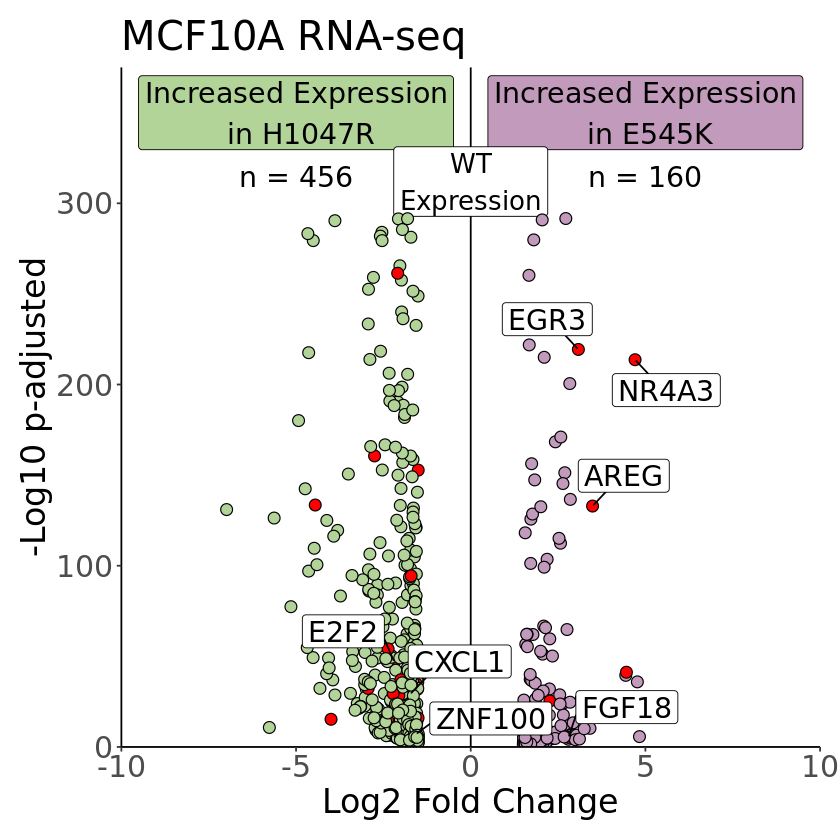

In [74]:
points2label <- combined_plotting_df %>% filter(-log10(padj) < 350) %>%
                dplyr::filter(symbol_col %in% select_hits)
# points2label
volcano <- combined_plotting_df %>% filter(-log10(padj) < 350) %>%
  ggplot(aes(x = log2FoldChange, y = -log10(padj), label = symbol_col, 
             fill = as.factor(coloring))) +
  coord_cartesian(xlim = c(-10, 10), ylim = c(0,375), expand = FALSE) +
#   annotate("rect", xmin = 0, ymin = -Inf, ymax = Inf, xmax = Inf, 
#                   fill = "#C29ABB", alpha = 0.5) +
#   annotate("rect", xmin = 0, ymin = -Inf, ymax = Inf, xmax = -Inf, 
#                   fill = "#B2D498", alpha = 0.5) +
  annotate("label", x = 5, y = 350, label = "Increased Expression\n in E545K",
           family = "Arial", size = 6, fill = "#C29ABB") +
  annotate("label", x = -5, y = 350, label = "Increased Expression\n in H1047R",
           family = "Arial", size = 6, fill = "#B2D498") + 
  annotate("text", x = -5, y = 315, label = "n = 456", size = 6, family = "Arial") +
  annotate("text", x = 5, y = 315, label = "n = 160", size = 6, family = "Arial") +
  geom_vline(xintercept = 0) +
  annotate("label", x = 0, y = 312, label = "WT\nExpression", fill = "white",
           size = 5.5, family = "Arial") +
  geom_point(shape = 21, colour = "black", size =3) +
  scale_fill_manual(values = c("red", "#B2D498", "#C29ABB")) +
  ggtitle(label = "MCF10A RNA-seq") +
  geom_label_repel(data = points2label, fill = "white", max.overlaps = Inf,
                   box.padding = 0.5, size = 6) + 
  xlab("Log2 Fold Change") + ylab("-Log10 p-adjusted") +
  theme_classic() + theme(legend.position="none", 
                          text = element_text(family = "Arial"),
                          axis.title = element_text(size = 20),
                          axis.text = element_text(size = 18),
                          plot.title = element_text(size = 24),
                          plot.subtitle = element_text(size = 12),
                          plot.margin = margin(12, 12, 12, 12))
volcano

# Venn Stats

In [75]:
combined_plotting_df

,comparison,log2FoldChange,symbol_col,padj,coloring
,<chr>,<dbl>,<chr>,<dbl>,<chr>
ENSG00000117148,myRNA_MCF10A_WTvex9,1.787999,ACTL8,1.558454e-02,myRNA_MCF10A_WTvex9
ENSG00000223382,myRNA_MCF10A_WTvex9,1.707627,LINC01778,4.648350e-03,myRNA_MCF10A_WTvex9
ENSG00000092853,myRNA_MCF10A_WTvex9,1.587697,CLSPN,6.545621e-24,myRNA_MCF10A_WTvex9
ENSG00000171812,myRNA_MCF10A_WTvex9,1.623644,COL8A2,6.340255e-03,myRNA_MCF10A_WTvex9
ENSG00000222009,myRNA_MCF10A_WTvex9,2.252911,BTBD19,9.996070e-33,myRNA_MCF10A_WTvex9
ENSG00000186377,myRNA_MCF10A_WTvex9,2.753097,CYP4X1,8.986998e-13,myRNA_MCF10A_WTvex9
ENSG00000169213,myRNA_MCF10A_WTvex9,3.163991,RAB3B,2.338030e-27,myRNA_MCF10A_WTvex9
ENSG00000081985,myRNA_MCF10A_WTvex9,1.701784,IL12RB2,7.348190e-05,myRNA_MCF10A_WTvex9
ENSG00000171517,myRNA_MCF10A_WTvex9,1.702782,LPAR3,4.435616e-38,myRNA_MCF10A_WTvex9


In [76]:
ex9_genes <- combined_plotting_df %>% filter(comparison == "myRNA_MCF10A_WTvex9")
ex9_genes
ex20_genes <- combined_plotting_df %>% filter(comparison == "myRNA_MCF10A_WTvex20")
ex20_genes

,comparison,log2FoldChange,symbol_col,padj,coloring
,<chr>,<dbl>,<chr>,<dbl>,<chr>
ENSG00000117148,myRNA_MCF10A_WTvex9,1.787999,ACTL8,1.558454e-02,myRNA_MCF10A_WTvex9
ENSG00000223382,myRNA_MCF10A_WTvex9,1.707627,LINC01778,4.648350e-03,myRNA_MCF10A_WTvex9
ENSG00000092853,myRNA_MCF10A_WTvex9,1.587697,CLSPN,6.545621e-24,myRNA_MCF10A_WTvex9
ENSG00000171812,myRNA_MCF10A_WTvex9,1.623644,COL8A2,6.340255e-03,myRNA_MCF10A_WTvex9
ENSG00000222009,myRNA_MCF10A_WTvex9,2.252911,BTBD19,9.996070e-33,myRNA_MCF10A_WTvex9
ENSG00000186377,myRNA_MCF10A_WTvex9,2.753097,CYP4X1,8.986998e-13,myRNA_MCF10A_WTvex9
ENSG00000169213,myRNA_MCF10A_WTvex9,3.163991,RAB3B,2.338030e-27,myRNA_MCF10A_WTvex9
ENSG00000081985,myRNA_MCF10A_WTvex9,1.701784,IL12RB2,7.348190e-05,myRNA_MCF10A_WTvex9
ENSG00000171517,myRNA_MCF10A_WTvex9,1.702782,LPAR3,4.435616e-38,myRNA_MCF10A_WTvex9


,comparison,log2FoldChange,symbol_col,padj,coloring
,<chr>,<dbl>,<chr>,<dbl>,<chr>
ENSG00000157873,myRNA_MCF10A_WTvex20,-1.942156,TNFRSF14,1.932481e-19,myRNA_MCF10A_WTvex20
ENSG00000236423,myRNA_MCF10A_WTvex20,-2.154102,LINC01134,1.696185e-21,myRNA_MCF10A_WTvex20
ENSG00000187017,myRNA_MCF10A_WTvex20,-2.088529,ESPN,4.002241e-191,myRNA_MCF10A_WTvex20
ENSG00000284693,myRNA_MCF10A_WTvex20,-2.299545,LINC02606,1.692621e-08,myRNA_MCF10A_WTvex20
ENSG00000239149,myRNA_MCF10A_WTvex20,-1.509310,SNORA59B,8.036054e-04,myRNA_MCF10A_WTvex20
ENSG00000117115,myRNA_MCF10A_WTvex20,-4.118926,PADI2,1.012388e-125,myRNA_MCF10A_WTvex20
ENSG00000204219,myRNA_MCF10A_WTvex20,-1.885079,TCEA3,1.702500e-30,myRNA_MCF10A_WTvex20
ENSG00000007968,myRNA_MCF10A_WTvex20,-2.189308,E2F2,1.093726e-47,hit
ENSG00000158055,myRNA_MCF10A_WTvex20,-2.452590,GRHL3,1.941276e-167,myRNA_MCF10A_WTvex20


In [77]:
shared_genes <- intersect(ex9_genes$symbol_col, ex20_genes$symbol_col)
summary(shared_genes)

   Length     Class      Mode 
        0 character character 

In [78]:
ATAC_E545K_genes
ATAC_H1047R_genes

Entrez_ID,symbol
<dbl>,<chr>
57449,PLEKHG5
80176,SPSB1
55187,VPS13D
23254,KAZN
55160,ARHGEF10L
9923,ZBTB40
55616,ASAP3
10163,WASF2
7049,TGFBR3


Entrez_ID,symbol
<dbl>,<chr>
100132074,FOXO6
59269,HIVEP3
10103,TSPAN1
10207,PATJ
149047,MGC27382
3192,HNRNPU
114818,KLHL29
3344,FOXN2
56603,CYP26B1


In [79]:
shared_ATAC_genes <- intersect(ATAC_E545K_genes$symbol, ATAC_H1047R_genes$symbol)
summary(shared_ATAC_genes)

   Length     Class      Mode 
      369 character character 

In [80]:
E545K_union <- intersect(ATAC_E545K_genes$symbol, ex9_genes$symbol_col)
summary(E545K_union)

   Length     Class      Mode 
       13 character character 

In [81]:
H1047R_union <- intersect(ATAC_H1047R_genes$symbol, ex20_genes$symbol_col)
summary(H1047R_union)

   Length     Class      Mode 
       93 character character 

In [82]:
cross_union1 <- intersect(ATAC_E545K_genes$symbol, ex20_genes$symbol_col)
summary(cross_union1)

   Length     Class      Mode 
       46 character character 

In [83]:
cross_union2 <- intersect(ATAC_H1047R_genes$symbol, ex9_genes$symbol_col)
summary(cross_union2)

   Length     Class      Mode 
       35 character character 

In [84]:
xxunion <- intersect(intersect(ATAC_H1047R_genes$symbol, ATAC_E545K_genes$symbol), 
                     ex9_genes$symbol_col)
summary(xxunion)

   Length     Class      Mode 
        4 character character 

In [85]:
xxunion2 <- intersect(intersect(ATAC_H1047R_genes$symbol, ATAC_E545K_genes$symbol), 
                     ex20_genes$symbol_col)
summary(xxunion2)

   Length     Class      Mode 
       17 character character 

In [86]:
MCF10A_peakGenes_df$MCF10A_H1047R_enr_E545KvH1047R$symbol_col2
MCF10A_peakGenes_df$MCF10A_E545K_enr_E545KvH1047R$symbol_col2

[1] "INAVA" "INAVA" "INAVA" "MYBL1" "INAVA" "MYBL1" "MYBL1"

[1] "CAMTA1"           "VPS13D"           "VPS13D"          
   [4] "ACTL8"            "IFFO2"            "IFFO2"           
   [7] "IFFO2"            "ECE1"             "ALPL"            
  [10] "ASAP3"            "TENT5B"           "PHC2"            
  [13] "CSMD2"            "LINC01343"        "EDN2"            
  [16] "SPATA6"           "SSBP3"            "JUN"             
  [19] "NFIA"             "NEGR1"            "LOC105378797"    
  [22] "LOC105378797"     "LINC02792"        "BCL10-AS1"       
  [25] "TGFBR3"           "PLPPR5-AS1"       "COL11A1"         
  [28] "COL11A1"          "AHCYL1"           "DENND2D"         
  [31] "PHTF1"            "TSPAN2"           "LINC01765"       
  [34] "LINC01765"        "RNVU1-4"          "LOC105371433"    
  [37] "ADAMTSL4-AS1"     "TPM3"             "ATP8B2"          
  [40] "PMVK"             "PBXIP1"           "SPATA46"         
  [43] "CCDC190"          "XCL1"             "FMO2"            
  [46] "PAPPA2"           "MIR4424"          "IER5"            
  [49] "LAMC2"            "GS1-204I12.4"     "PDC-AS1"         
  [52] "NEK7"             "PTPRC"            "CD55"            
  [55] "KCNH1"            "ATF3"             "PTPN14"          
  [58] "PTPN14"           "ESRRG"            "TGFB2"           
  [61] "LINC02869"        "ZC3H11B"          "CCSAP"           
  [64] "ACTA1"            "GALNT2"           "DISC1"           
  [67] "LINC01744"        "IRF2BP2"          "LOC101927851"    
  [70] "LOC101927851"     "RNF144A"          "HS1BP3-IT1"      
  [73] "GCKR"             "LINC01460"        "LOC100505716"    
  [76] "LOC100505716"     "FOSL2"            "PLB1"            
  [79] "LOC105374461"     "MIR548AD"         "CRIM1"           
  [82] "VIT"              "LOC105374464"     "CDC42EP3"        
  [85] "LINC01819"        "LINC01119"        "CALM2"           
  [88] "LHCGR"            "LOC105374601"     "LOC100129434"    
  [91] "LINC01800"        "EXOC6B"           "LOXL3"           
  [94] "POLR1A"           "TMEM127"          "NPAS2"           
  [97] "FHL2"             "CD8B2"            "DPP10"           
 [100] "DDX18"            "C1QL2"            "GYPC"            
 [103] "GYPC"             "TMEM163"          "THSD7B"          
 [106] "MIR7157"          "LRP1B"            "LRP1B"           
 [109] "LOC101928386"     "GTDC1"            "GTDC1"           
 [112] "LINC01931"        "LOC105373682"     "LOC105373682"    
 [115] "RND3"             "RND3"             "RND3"            
 [118] "GCA"              "CHRNA1"           "LNPK"            
 [121] "LNPK"             "PDE11A-AS1"       "ZNF385B"         
 [124] "ZNF385B"          "ZNF385B"          "ITPRID2"         
 [127] "LOC105373780"     "FSIP2-AS2"        "FSIP2-AS2"       
 [130] "ANKAR"            "HIBCH"            "NABP1"           
 [133] "AOX1"             "CPO"              "KLF7"            
 [136] "CREB1"            "PTH2R"            "FN1"             
 [139] "FN1"              "LOC105373873"     "SPEG"            
 [142] "SGPP2"            "DNER"             "PTMA"            
 [145] "COL6A3"           "LRRFIP1"          "ASB1"            
 [148] "LOC105373980"     "ITPR1"            "LMCD1-AS1"       
 [151] "LMCD1-AS1"        "LOC339862"        "THRB"            
 [154] "GADL1"            "MIR466"           "ZKSCAN7-AS1"     
 [157] "PRSS42P"          "RBM5"             "LINC02017"       
 [160] "LINC02017"        "LINC02030"        "WNT5A"           
 [163] "FLNB"             "CFAP20DC-DT"      "PTPRG"           
 [166] "PRICKLE2"         "LINC00877"        "SHQ1"            
 [169] "CSNKA2IP"         "MTHFD2P1"         "LOC105374003"    
 [172] "MIR3921"          "FILIP1L"          "IMPG2"           
 [175] "ALCAM"            "BBX"              "MIR4445"         
 [178] "ZBED2"            "PHLDB2"           "CCDC80"          
 [181] "LOC107986022"     "MYLK-AS1"         "MYLK-AS1"        
 [184] "UROC1"            "TMCC1-DT"         "BFSP2"           
 [187] "AMOTL2"           "LOC10537

In [87]:
mart <- useMart("ENSEMBL_MART_ENSEMBL")
mart

Object of class 'Mart':
  Using the ENSEMBL_MART_ENSEMBL BioMart database
  No dataset selected.

In [88]:
length(mappedkeys(org.Hs.egSYMBOL))

[1] 63901

## hypergeo heatmap?

phyper(Overlap-1, group2, Total-group2, group1,lower.tail= FALSE)

In [89]:
.Machine$double.xmax

[1] 1.797693e+308

In [90]:
length(unique(mappedkeys(org.Hs.egALIAS2EG)))

[1] 128953

datasets

In [91]:
E545Kexpression <- ex9_genes$symbol_col %>% unique()
str(E545Kexpression)
H1047Rexpression <- ex20_genes$symbol_col %>% unique()
str(H1047Rexpression)

 chr [1:160] "ACTL8" "LINC01778" "CLSPN" "COL8A2" "BTBD19" "CYP4X1" "RAB3B" ...
 chr [1:456] "TNFRSF14" "LINC01134" "ESPN" "LINC02606" "SNORA59B" "PADI2" ...


In [92]:
E545KvWT_accAnno <- ATAC_E545K_genes$symbol %>% 
                    as.data.frame() %>% unique()
E545Kvmut_accAnno <-  MCF10A_peakGenes_df$MCF10A_E545K_enr_E545KvH1047R$symbol_col2 %>% 
                    unique()
H1047RvWT_accAnno <- ATAC_H1047R_genes$symbol %>% 
                    as.data.frame() %>% unique()
H1047Rvmut_accAnno <- MCF10A_peakGenes_df$MCF10A_H1047R_enr_E545KvH1047R$symbol_col2 %>% 
                    unique()
str(E545KvWT_accAnno)
str(E545Kvmut_accAnno)
str(H1047RvWT_accAnno)
str(H1047Rvmut_accAnno)

'data.frame':	1045 obs. of  1 variable:
 $ .: chr  "PLEKHG5" "SPSB1" "VPS13D" "KAZN" ...
 chr [1:2523] "CAMTA1" "VPS13D" "ACTL8" "IFFO2" "ECE1" "ALPL" "ASAP3" ...
'data.frame':	3349 obs. of  1 variable:
 $ .: chr  "FOXO6" "HIVEP3" "TSPAN1" "PATJ" ...
 chr [1:2] "INAVA" "MYBL1"


In [93]:
pval_E545Kexpr <- phyper(
    length(E545Kexpression)-1,
    length(E545Kexpression),
    128953-length(E545Kexpression),
    length(E545Kexpression),
    lower.tail= FALSE)
(pval_E545Kexpr)

[1] 0

In [94]:
overlapE545Kexpr_E545KvWT_accAnno <- intersect(E545Kexpression, 
                                               E545KvWT_accAnno$.)
length(overlapE545Kexpr_E545KvWT_accAnno)

[1] 13

In [95]:
pval_E545Kexpr_E545KvWT_accAnno <- phyper(
                                length(overlapE545Kexpr_E545KvWT_accAnno)-1,
                                length(E545KvWT_accAnno$.),
                                128953-length(E545KvWT_accAnno$.),
                                length(E545Kexpression), 
                                lower.tail= FALSE)
pval_E545Kexpr_E545KvWT_accAnno

[1] 8.858236e-10

In [96]:
overlapE545Kexpr_E545Kvmut_accAnno <- intersect(
                                    E545Kexpression, 
                                    E545Kvmut_accAnno)

In [97]:
pval_E545Kexpr_E545Kvmut_accAnno <- phyper(
                                length(overlapE545Kexpr_E545Kvmut_accAnno)-1,
                                length(E545Kvmut_accAnno),
                                128953-length(E545Kvmut_accAnno),
                                length(E545Kexpression), 
                                lower.tail= FALSE)
pval_E545Kexpr_E545Kvmut_accAnno

[1] 5.523692e-24

In [98]:
overlapE545Kexpr_H1047R_expr <- intersect(
                                    E545Kexpression, H1047Rexpression)

In [99]:
pval_E545Kexpr_H1047Rexpr <- phyper(
                                length(overlapE545Kexpr_H1047R_expr)-1,
                                length(H1047Rexpression),
                                128953-length(H1047Rexpression),
                                length(E545Kexpression), 
                                lower.tail= FALSE)
-log(pval_E545Kexpr_H1047Rexpr)

[1] 0

In [100]:
overlapE545Kexpr_H1047RvWT_accAnno <- intersect(
                                    E545Kexpression, H1047RvWT_accAnno$.)
length(overlapE545Kexpr_H1047RvWT_accAnno)

[1] 35

In [101]:
length(E545Kexpression)

[1] 160

In [102]:
pval_E545Kexpr__H1047RvWT_accAnno <- phyper(
                                length(overlapE545Kexpr_H1047RvWT_accAnno)-1,
                                length(H1047RvWT_accAnno$.),
                                128953-length(H1047RvWT_accAnno$.),
                                length(E545Kexpression), 
                                lower.tail= FALSE)
-log(pval_E545Kexpr__H1047RvWT_accAnno)

[1] 49.63654

In [103]:
H1047Rvmut_accAnno
overlapE545Kexpr_H1047RvWT_accAnno <- intersect(
                                    E545Kexpression, H1047Rvmut_accAnno)
length(overlapE545Kexpr_H1047RvWT_accAnno)

[1] "INAVA" "MYBL1"

[1] 0

In [104]:
overlapE545KvWT_accAnno <- intersect(E545KvWT_accAnno$., E545Kvmut_accAnno)
length(overlapE545KvWT_accAnno)

[1] 354

In [105]:
pval_E545KvWT_accAnno_E545Kvmut_accAnno <- phyper(
                                length(overlapE545KvWT_accAnno)-1,
                                length(E545Kvmut_accAnno),
                                128953-length(E545Kvmut_accAnno),
                                length(E545KvWT_accAnno$.), 
                                lower.tail= FALSE)
pval_E545KvWT_accAnno_E545Kvmut_accAnno

[1] 0

In [106]:
overlapE545KvWT_accAnno_H1047Rexpression <- intersect(
                                    E545KvWT_accAnno$., H1047Rexpression)
length(overlapE545KvWT_accAnno_H1047Rexpression)

[1] 46

In [107]:
pval_E545KvWT_accAnno_H1047Rexpression <- phyper(
                                length(overlapE545KvWT_accAnno_H1047Rexpression)-1,
                                length(H1047Rexpression),
                                128953-length(H1047Rexpression),
                                length(E545KvWT_accAnno$.), 
                                lower.tail= FALSE)
pval_E545KvWT_accAnno_H1047Rexpression

[1] 3.640792e-35

In [108]:
overlapE545KvWT_accAnno_H1047RvWT_accAnno <- intersect(
                                    E545KvWT_accAnno$., H1047RvWT_accAnno$.)
length(overlapE545KvWT_accAnno_H1047RvWT_accAnno)

[1] 369

In [109]:
length(E545KvWT_accAnno$.)

[1] 1045

In [110]:
pval_E545KvWT_accAnno_H1047RvWT_accAnno <- phyper(
                                length(overlapE545KvWT_accAnno_H1047RvWT_accAnno)-1,
                                length(H1047RvWT_accAnno$.),
                                128953-length(H1047RvWT_accAnno$.),
                                length(E545KvWT_accAnno$.), 
                                lower.tail= FALSE)
pval_E545KvWT_accAnno_H1047RvWT_accAnno

[1] 1.800513e-308

In [111]:
overlapE545KvWT_accAnno_H1047Rvmut_accAnno <- intersect(
                                    E545KvWT_accAnno$., H1047Rvmut_accAnno)
length(overlapE545KvWT_accAnno_H1047Rvmut_accAnno)

[1] 0

In [112]:
overlapE545Kvmut_accAnno_H1047Rexpression <- intersect(
                                    E545Kvmut_accAnno, H1047Rexpression)
length(overlapE545Kvmut_accAnno_H1047Rexpression)

[1] 64

In [113]:
pval_E545Kvmut_accAnno_H1047Rexpression <- phyper(
                                length(overlapE545Kvmut_accAnno_H1047Rexpression)-1,
                                length(H1047Rexpression),
                                128953-length(H1047Rexpression),
                                length(E545Kvmut_accAnno), 
                                lower.tail= FALSE)
pval_E545Kvmut_accAnno_H1047Rexpression

[1] 1.368156e-34

In [114]:
overlapE545Kvmut_accAnno_H1047RvWT_accAnno <- intersect(
                                    E545Kvmut_accAnno, H1047RvWT_accAnno$.)
length(overlapE545Kvmut_accAnno_H1047RvWT_accAnno)

[1] 604

In [115]:
pval_E545Kvmut_accAnno_H1047RvWT_accAnno <- phyper(
                                length(overlapE545Kvmut_accAnno_H1047RvWT_accAnno)-1,
                                length(H1047RvWT_accAnno$.),
                                128953-length(H1047RvWT_accAnno$.),
                                length(E545Kvmut_accAnno), 
                                lower.tail= FALSE)
pval_E545Kvmut_accAnno_H1047RvWT_accAnno

[1] 0

In [116]:
overlapH1047Rexpression_H1047RvWT_accAnno <- intersect(
                                    H1047Rexpression, H1047RvWT_accAnno$.)
length(overlapH1047Rexpression_H1047RvWT_accAnno)

[1] 93

In [117]:
length(H1047RvWT_accAnno$.)

[1] 3349

In [118]:
pval_H1047Rexpression_H1047RvWT_accAnno <- phyper(
                                length(overlapH1047Rexpression_H1047RvWT_accAnno)-1,
                                length(H1047RvWT_accAnno$.),
                                128953-length(H1047RvWT_accAnno$.),
                                length(H1047Rexpression), 
                                lower.tail= FALSE)
pval_H1047Rexpression_H1047RvWT_accAnno

[1] 7.009557e-54

In [119]:
overlapH1047RvWT_accAnno_H1047Rvmut_accAnno <- intersect(
                                    H1047RvWT_accAnno$., H1047Rvmut_accAnno)
length(overlapH1047RvWT_accAnno_H1047Rvmut_accAnno)

[1] 0

In [120]:
overlapH1047RvWT_accAnno_H1047Rvmut_accAnno

character(0)

In [121]:
-log(1)
-log(0)

[1] 0

[1] Inf

In [122]:
pval_E545KvWT_accAnno_H1047Rexpression

[1] 3.640792e-35

In [123]:
pval_E545Kexpr_E545Kvmut_accAnno

[1] 5.523692e-24

In [124]:
matrix_data <- c(0,pval_E545Kexpr_E545KvWT_accAnno,pval_E545Kexpr_E545Kvmut_accAnno,
          1,pval_E545Kexpr__H1047RvWT_accAnno,1,
                 pval_E545Kexpr_E545KvWT_accAnno,0,pval_E545KvWT_accAnno_E545Kvmut_accAnno,
                 pval_E545KvWT_accAnno_H1047Rexpression,pval_E545KvWT_accAnno_H1047RvWT_accAnno,1,
                 pval_E545Kexpr_E545Kvmut_accAnno, pval_E545KvWT_accAnno_E545Kvmut_accAnno,0,
                 pval_E545Kvmut_accAnno_H1047Rexpression,pval_E545Kvmut_accAnno_H1047RvWT_accAnno,1,
                 1,pval_E545KvWT_accAnno_H1047Rexpression,pval_E545Kvmut_accAnno_H1047Rexpression,
                 0,pval_H1047Rexpression_H1047RvWT_accAnno,1,
                 pval_E545Kexpr__H1047RvWT_accAnno,pval_E545KvWT_accAnno_H1047RvWT_accAnno,pval_E545Kvmut_accAnno_H1047RvWT_accAnno,
                 pval_H1047Rexpression_H1047RvWT_accAnno,0,1,
                 1,1,1,1,1,0)
matrix_data

[1]  0.000000e+00  8.858236e-10  5.523692e-24  1.000000e+00  2.774115e-22
 [6]  1.000000e+00  8.858236e-10  0.000000e+00  0.000000e+00  3.640792e-35
[11] 1.800513e-308  1.000000e+00  5.523692e-24  0.000000e+00  0.000000e+00
[16]  1.368156e-34  0.000000e+00  1.000000e+00  1.000000e+00  3.640792e-35
[21]  1.368156e-34  0.000000e+00  7.009557e-54  1.000000e+00  2.774115e-22
[26] 1.800513e-308  0.000000e+00  7.009557e-54  0.000000e+00  1.000000e+00
[31]  1.000000e+00  1.000000e+00  1.000000e+00  1.000000e+00  1.000000e+00
[36]  0.000000e+00

In [125]:
mdat <- matrix(-log(matrix_data), 
               nrow = 6, ncol = 6, byrow = TRUE,
               dimnames = list(c("E545K expressed genes", "E545K annotated genes over WT",
                                 "E545K annotated genes over H1047R", 
                                 "H1047R expressed genes", "H1047R annotated genes over WT",
                                 "H1047R annotated genes over E545K"),
                               c("E545K expressed genes", "E545K annotated genes over WT",
                                 "E545K annotated genes over H1047R", 
                                 "H1047R expressed genes", "H1047R annotated genes over WT",
                                 "H1047R annotated genes over E545K")))
mdat

,E545K expressed genes,E545K annotated genes over WT,E545K annotated genes over H1047R,H1047R expressed genes,H1047R annotated genes over WT,H1047R annotated genes over E545K
E545K expressed genes,Inf,20.84450,53.55300,0.00000,49.63654,0
E545K annotated genes over WT,20.84450,Inf,Inf,79.29828,708.60814,0
E545K annotated genes over H1047R,53.55300,Inf,Inf,77.97443,Inf,0
H1047R expressed genes,0.00000,79.29828,77.97443,Inf,122.39232,0
H1047R annotated genes over WT,49.63654,708.60814,Inf,122.39232,Inf,0
H1047R annotated genes over E545K,0.00000,0.00000,0.00000,0.00000,0.00000,Inf


In [126]:
mdat[sapply(mdat, is.infinite)] <- NA
mdat

,E545K expressed genes,E545K annotated genes over WT,E545K annotated genes over H1047R,H1047R expressed genes,H1047R annotated genes over WT,H1047R annotated genes over E545K
E545K expressed genes,NA,20.84450,53.55300,0.00000,49.63654,0
E545K annotated genes over WT,20.84450,NA,NA,79.29828,708.60814,0
E545K annotated genes over H1047R,53.55300,NA,NA,77.97443,NA,0
H1047R expressed genes,0.00000,79.29828,77.97443,NA,122.39232,0
H1047R annotated genes over WT,49.63654,708.60814,NA,122.39232,NA,0
H1047R annotated genes over E545K,0.00000,0.00000,0.00000,0.00000,0.00000,NA


In [127]:
library(pheatmap)

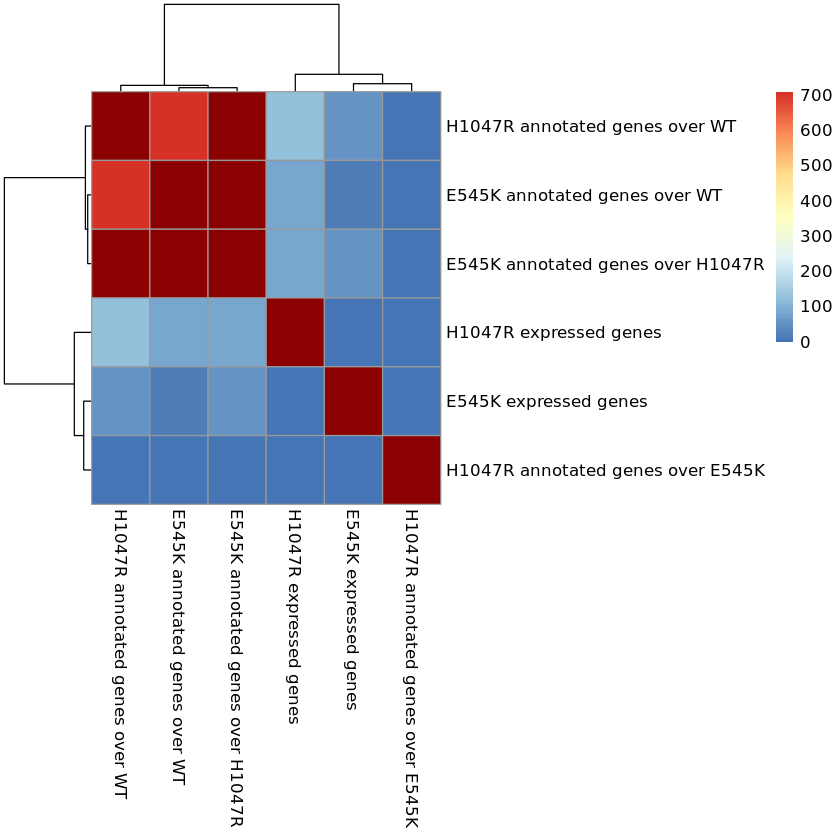

In [128]:
pheatmap(mdat, na_col = "#8b0000")

In [129]:
matrix_data4x4 <- c(0,pval_E545KvWT_accAnno_H1047RvWT_accAnno,pval_E545Kexpr_E545KvWT_accAnno,pval_E545KvWT_accAnno_H1047Rexpression,
                    pval_E545KvWT_accAnno_H1047RvWT_accAnno,0,pval_E545Kexpr__H1047RvWT_accAnno,pval_H1047Rexpression_H1047RvWT_accAnno,
                    pval_E545Kexpr_E545KvWT_accAnno,pval_E545Kexpr__H1047RvWT_accAnno,0,1,
                    pval_E545KvWT_accAnno_H1047Rexpression,pval_H1047Rexpression_H1047RvWT_accAnno,1,0)
matrix_data4x4

[1]  0.000000e+00 1.800513e-308  8.858236e-10  3.640792e-35 1.800513e-308
 [6]  0.000000e+00  2.774115e-22  7.009557e-54  8.858236e-10  2.774115e-22
[11]  0.000000e+00  1.000000e+00  3.640792e-35  7.009557e-54  1.000000e+00
[16]  0.000000e+00

In [130]:
mdat4x4 <- matrix(-log(matrix_data4x4), 
               nrow = 4, ncol = 4, byrow = TRUE,
               dimnames = list(c("E545K annotated genes over WT", "H1047R annotated genes over WT",
                                 "E545K expressed genes", "H1047R expressed genes"),
                               c("E545K annotated genes over WT", "H1047R annotated genes over WT",
                                 "E545K expressed genes", "H1047R expressed genes")))
mdat4x4

,E545K annotated genes over WT,H1047R annotated genes over WT,E545K expressed genes,H1047R expressed genes
E545K annotated genes over WT,Inf,708.60814,20.84450,79.29828
H1047R annotated genes over WT,708.60814,Inf,49.63654,122.39232
E545K expressed genes,20.84450,49.63654,Inf,0.00000
H1047R expressed genes,79.29828,122.39232,0.00000,Inf


In [131]:
pvalmat <- matrix((matrix_data4x4), 
               nrow = 4, ncol = 4, byrow = TRUE,
               dimnames = list(c("E545K annotated genes over WT", "H1047R annotated genes over WT",
                                 "E545K expressed genes", "H1047R expressed genes"),
                               c("E545K annotated genes over WT", "H1047R annotated genes over WT",
                                 "E545K expressed genes", "H1047R expressed genes")))
pvalmat <- format(pvalmat, digits=3)
pvalmat

,E545K annotated genes over WT,H1047R annotated genes over WT,E545K expressed genes,H1047R expressed genes
E545K annotated genes over WT,0.00e+00,1.80e-308,8.86e-10,3.64e-35
H1047R annotated genes over WT,1.80e-308,0.00e+00,2.77e-22,7.01e-54
E545K expressed genes,8.86e-10,2.77e-22,0.00e+00,1.00e+00
H1047R expressed genes,3.64e-35,7.01e-54,1.00e+00,0.00e+00


In [132]:
mdat4x4[sapply(mdat4x4, is.infinite)] <- NA
mdat4x4

,E545K annotated genes over WT,H1047R annotated genes over WT,E545K expressed genes,H1047R expressed genes
E545K annotated genes over WT,NA,708.60814,20.84450,79.29828
H1047R annotated genes over WT,708.60814,NA,49.63654,122.39232
E545K expressed genes,20.84450,49.63654,NA,0.00000
H1047R expressed genes,79.29828,122.39232,0.00000,NA


In [133]:
makeColorRampPalette <- function(colors, cutoff.fraction, num.colors.in.palette)
{
  stopifnot(length(colors) == 4)
  ramp1 <- colorRampPalette(colors[1:2])(num.colors.in.palette * cutoff.fraction)
  ramp2 <- colorRampPalette(colors[3:4])(num.colors.in.palette * (1 - cutoff.fraction))
  return(c(ramp1, ramp2))
}

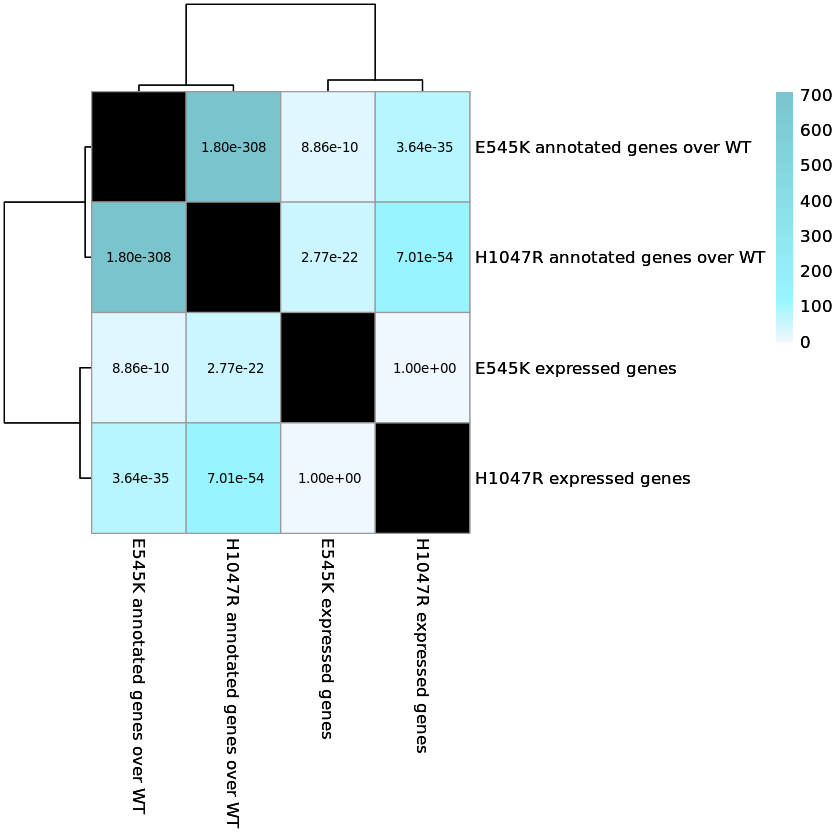

In [134]:
cutoff.distance <- 125  
cols <- makeColorRampPalette(c("aliceblue", "cadetblue1",    # distances 0 to 3 colored from white to red
                               "cadetblue1", "cadetblue3"), # distances 3 to max(distmat) colored from green to black
                             cutoff.distance / 725,
                             400)
p <- pheatmap((mdat4x4), na_col = "black", display_numbers = pvalmat,
         number_color = "black", color = cols
         )
p

In [135]:
library(ggplot2)

In [136]:
pdf(file = "/data/park_lab/adam/figures/hypergeoheat2_8-11.pdf",
    width = 6, height = 6)
p
dev.off()

png 
  2

In [137]:
save.image(file = "hypergeoheat.RData")

In [138]:
MCF10A_myRNA_bigList_mutGenes <- as.character(MCF10A_myRNA_bigList_mut$symbol_col)
str(MCF10A_myRNA_bigList_mutGenes)

 chr [1:616] "ACTL8" "LINC01778" "CLSPN" "COL8A2" "BTBD19" "CYP4X1" "RAB3B" ...


Genes in both ATAC and my RNA-seq for MCF10A exclusively

In [143]:
MCF10A_combined_genes <- intersect(MCF10A_ATAC_Genes,
                                   MCF10A_myRNA_bigList_mutGenes)
str(MCF10A_combined_genes)
str(MCF10A_ATAC_Genes)
str(MCF10A_myRNA_bigList_mutGenes)

 chr [1:312] "ACTL8" "EDN2" "DENND2D" "ATP8B2" "SPATA46" "ATF3" "ITPR1" ...
 chr [1:9677] "CAMTA1" "VPS13D" "ACTL8" "IFFO2" "ECE1" "ALPL" "ASAP3" ...
 chr [1:616] "ACTL8" "LINC01778" "CLSPN" "COL8A2" "BTBD19" "CYP4X1" "RAB3B" ...


In [ ]:
MCF10A_un_genes <- setdiff(MCF10A_myRNA_bigList_mutGenes,
                                   MCF10A_ATAC_Genes)
str(MCF10A_un_genes)
MCF10A_un_genes

In [ ]:
better_names <- make.names(names(full_brunello))
better_names
names(full_brunello) <- better_names
names(full_brunello)

In [ ]:
MCF10A_guides <- full_brunello %>%
                dplyr::filter(Target.Gene.Symbol %in% MCF10A_combined_genes)
MCF10A_guides

In [ ]:
getwd()

In [ ]:
write_tsv(MCF10A_guides, file = "MCF10A_guides.txt")

Enrichr Results for the MCF10A guides file

https://maayanlab.cloud/Enrichr/enrich?dataset=9768fe9437b7f1b6323d53b56a204d05

In [ ]:
MCF10A_combined_genes

### Euler of ATAC and RNA genes (Mutant Comparisons)

In [ ]:
library(ChIPseeker)
library(regioneR)
library(TxDb.Hsapiens.UCSC.hg38.knownGene)
txdb <- TxDb.Hsapiens.UCSC.hg38.knownGene
library(org.Hs.eg.db)
library(tidyverse)

In [ ]:
cluster2bed <- readRDS(
    file = "/gpfs52/data/park_lab/adam/files4deepTools/cluster2regions.rds")
cluster3bed <- readRDS(
    file = "/gpfs52/data/park_lab/adam/files4deepTools/cluster3regions.rds")
str(cluster2bed)
str(cluster3bed)

In [ ]:
cluster2_granges <- toGRanges(cluster2bed)
cluster3_granges <- toGRanges(cluster3bed)
cluster2_granges
cluster3_granges

In [ ]:
cluster2_anno <- annotatePeak(cluster2_granges, tssRegion=c(-3000, 3000),
                         TxDb=txdb, annoDb="org.Hs.eg.db")
cluster3_anno <- annotatePeak(cluster3_granges, tssRegion=c(-3000, 3000),
                         TxDb=txdb, annoDb="org.Hs.eg.db")
cluster2_anno
cluster3_anno

In [ ]:
cluster2gene <- seq2gene(
    cluster2_granges, tssRegion=c(-3000, 3000), flankDistance = 3000, TxDb=txdb)
cluster3gene <- seq2gene(
    cluster3_granges, tssRegion=c(-3000, 3000), flankDistance = 3000, TxDb=txdb)
cluster2gene
cluster3gene

In [ ]:
mutantComp_DEGenes <- readRDS(
    "/gpfs52/data/park_lab/adam/Total_RNA/mutantComp_DEGenes.rds")
mutantComp_DEGenes

In [ ]:
E545K_expr <- mutantComp_DEGenes %>% filter(log2FoldChange > 0)
H1047R_expr <- mutantComp_DEGenes %>% filter(log2FoldChange < 0)
str(E545K_expr)
str(H1047R_expr)
length(unique(E545K_expr$rowname))
length(unique(H1047R_expr$rowname))

In [ ]:
length(E545K_expr$rowname)
length(H1047R_expr$rowname)
length(unique(cluster2gene))
length(unique(cluster3gene))
summary(E545K_expr$entrez %in% unique(cluster2gene))
summary(E545K_expr$entrez %in% unique(cluster3gene))
summary(H1047R_expr$entrez %in% unique(cluster2gene))
summary(H1047R_expr$entrez %in% unique(cluster3gene))
summary(unique(cluster2gene) %in% unique(cluster3gene))
summary(E545K_expr$rowname %in% H1047R_expr$rowname)

In [ ]:
summary(intersect(E545K_expr$entrez, unique(cluster2gene)) %in% cluster3gene)

In [ ]:
summary(intersect(H1047R_expr$entrez, unique(cluster2gene)) %in% cluster3gene)

In [ ]:
library(eulerr)

In [ ]:
plotting_vec <- c(661, 610, 725, 1659, 35, 38, 21, 33, 91, 3, 3)
names(plotting_vec) <- c("E545K_expressed", "H1047R_expressed",
                         "Cluster2_annotated_genes", "Cluster3_annotated_genes",
                         "E545K_expressed&Cluster2_annotated_genes", "E545K_expressed&Cluster3_annotated_genes",
                         "H1047R_expressed&Cluster2_annotated_genes", "H1047R_expressed&Cluster3_annotated_genes",
                         "E545K_expressed&Cluster2_annotated_genes&Cluster3_annotated_genes",
                         "H1047R_expressed&Cluster2_annotated_genes&Cluster3_annotated_genes")
str(plotting_vec)

In [ ]:
fit1 <- euler(plotting_vec, input = "union")
plot(fit1)

In [ ]:
combo <- c("A" = 591, "B" = 559, "C" = 584, "D" = 1503,
           "A&C" = 32, "A&D" = 35, 
           "B&C" = 18, "B&D" = 30,
           "C&D" = 85,
           "A&C&D" = 3, "B&C&D" = 3)
fit1 <- euler(combo, input = 'union')

In [ ]:
plot(fit1)

# Diablo

In [ ]:
# BiocManager::install("mixOmicsTeam/mixOmics") 

## ATAC Data Cleaning

In [ ]:
library(tidyverse)
library(mixOmics)

In [ ]:
ATAC_peak_counts

In [ ]:
ATACPeaks_cleaned <- ATAC_peak_counts %>%
                    subset(select = -c(Chr, Start, End, Strand, Length)) %>%
                    t()
ATACPeaks_cleaned

Rename rows from the sequencing summaries

In [ ]:
good_names <- c("Htert_ex20_rep2",
               "cancer_ex9_rep1", "cancer_ex9_rep2",
               "cancer_WT_rep1", "cancer_WT_rep2",
               "Htert_WT_rep1", "Htert_WT_rep2",
               "Htert_ex9_rep1", "Htert_ex9_rep2",
               "Htert_ex20_rep1",
               "MCF10A_WT_rep1", "MCF10A_WT_rep2",
               "MCF10A_ex9_rep1", "MCF10A_ex9_rep2",
               "MCF10A_ex20_rep1", "MCF10A_ex20_rep2",
               "cancer_ex20_rep1", "cancer_ex20_rep2")
rownames(ATACPeaks_cleaned) <- good_names
ATACPeaks_cleaned

In [ ]:
ATACPeaks_cleaned <- as.data.frame(ATACPeaks_cleaned)
ATACPeaks_sorted <- rownames_to_column(ATACPeaks_cleaned, "SampleID")
ATACPeaks_sorted

In [ ]:
ATACPeaks_sorted <- ATACPeaks_sorted %>%
                    arrange(SampleID)
ATACPeaks_sorted

## RNA-seq Data Cleaning

In [ ]:
ls()

In [ ]:
setwd("/data/park_lab/adam/Total_RNA")
load("Total_RNA_env.RData")
ls()

In [ ]:
normalized_total_counts_t

In [ ]:
rownames(normalized_total_counts_t)

In [ ]:
NormCounts_RNA_Clean <- rownames_to_column(normalized_total_counts_t, "SampleID")
first2reps <- c("MCF10A_E545K_rep1", "MCF10A_E545K_rep2",
               "MCF10A_parental_rep1", "MCF10A_parental_rep2",
               "MCF7_corrected_rep1", "MCF7_corrected_rep2",
               "MCF7_parental_rep1", "MCF7_parental_rep2",
               "MCF10A_H1047R_rep1", "MCF10A_H1047R_rep2",
               "HTert_WT_rep1", "HTert_WT_rep2",
               "HTert_ex9_rep1", "HTert_ex9_rep2",
               "HTert_ex20_rep1", "HTert_ex20_rep2",
               "T47D_rep1", "T47D_rep2")
NormCounts_RNA_Clean <- NormCounts_RNA_Clean %>% 
                        dplyr::filter(SampleID %in% first2reps)
good_names2 <- c("MCF10A_ex9_rep1", "MCF10A_ex9_rep2",
                 "MCF10A_WT_rep1", "MCF10A_WT_rep2",
                 "cancer_WT_rep1", "cancer_WT_rep2",
                 "cancer_ex9_rep1", "cancer_ex9_rep2",
                 "MCF10A_ex20_rep1", "MCF10A_ex20_rep2",
                 "Htert_WT_rep1", "Htert_WT_rep2",
                 "Htert_ex9_rep1", "Htert_ex9_rep2",
                 "Htert_ex20_rep1", "Htert_ex20_rep2",
                 "cancer_ex20_rep1", "cancer_ex20_rep2")
NormCounts_RNA_Clean$SampleID <- good_names2
NormCounts_RNA_Clean <- NormCounts_RNA_Clean %>%
                        arrange(SampleID)
NormCounts_RNA_Clean

## Diablo Functions

In [ ]:
# rownames(ATACPeaks_sorted) <- ATACPeaks_sorted$SampleID
# ATACPeaks_sorted <- ATACPeaks_sorted %>%
#                     dplyr::select(!SampleID)
ATACPeaks_sorted <- as.matrix(ATACPeaks_sorted)
ATACPeaks_sorted

In [ ]:
rownames(NormCounts_RNA_Clean) <- NormCounts_RNA_Clean$SampleID
NormCounts_RNA_Clean <- NormCounts_RNA_Clean %>%
                        dplyr::select(!SampleID) %>%
                        as.matrix()
NormCounts_RNA_Clean

In [ ]:
multiOmics_List <- list(ATAC = ATACPeaks_sorted, RNA = NormCounts_RNA_Clean)
str(multiOmics_List)

In [ ]:
SampleClass_Total <- c("cancer_ex20", "cancer_ex20",
                     "cancer_ex9", "cancer_ex9",
                     "cancer_WT", "cancer_WT",
                     "Htert_ex20", "Htert_ex20",
                     "Htert_ex9", "Htert_ex9",
                     "Htert_WT", "Htert_WT",
                     "MCF10A_ex20", "MCF10A_ex20",
                     "MCF10A_ex9", "MCF10A_ex9",
                     "MCF10A_WT", "MCF10A_WT")
SampleClass_Geno <- c("ex20", "ex20", "ex9", "ex9", "WT", "WT",
                      "ex20", "ex20", "ex9", "ex9", "WT", "WT",
                      "ex20", "ex20", "ex9", "ex9", "WT", "WT")

In [ ]:
SampleClass_Total <- as.factor(SampleClass_Total)
SampleClass_Geno <- as.factor(SampleClass_Geno)
summary(SampleClass_Total)
summary(SampleClass_Geno)

In [ ]:
Diablo_Result_Total <- block.splsda(multiOmics_List, SampleClass_Total)
Diablo_Result_Geno <- block.splsda(multiOmics_List, SampleClass_Geno)
str(Diablo_Result_Total)
str(Diablo_Result_Geno)

In [ ]:
plotIndiv(Diablo_Result_Total,
         legend = TRUE,
         )

In [ ]:
plotIndiv(Diablo_Result_Geno,
         legend = TRUE)

In [ ]:
plotVar(Diablo_Result_Geno,
       legend = TRUE,
       pch=c(20,20))

In [ ]:
plotDiablo(Diablo_Result_Geno, ncomp = 2)

In [ ]:
plotLoadings(Diablo_Result_Geno, comp = 1, contrib = "max")

In [ ]:
set.seed(123) # for reproducibility in this vignette
MyPerf.diablo <- perf(Diablo_Result_Geno, validation = 'Mfold', folds = 5, 
                   nrepeat = 10, 
                   dist = 'centroids.dist')

In [ ]:
MyPerf.diablo

In [ ]:
plot(MyPerf.diablo)

In [ ]:
MyPerf.diablo$MajorityVote.error.rate

In [ ]:
MyPerf.diablo$choice.ncomp$WeightedVote

Let's try using only genes with symbols

In [ ]:
colnames(NormCounts_RNA_Clean)

In [ ]:
library(org.Hs.eg.db)
gene_list <- colnames(NormCounts_RNA_Clean)
  ens.str <- substr(x = gene_list, 1 , 15)
  symbol_list <- mapIds(org.Hs.eg.db,
                       keys = ens.str,
                       column = "SYMBOL",
                       keytype = "ENSEMBL",
                       multiVals= "first")
colnames(NormCounts_RNA_Clean) <- symbol_list

In [ ]:
NormCounts_RNA_Clean_Symbols <- NormCounts_RNA_Clean
NormCounts_RNA_Clean_Symbols

In [ ]:
NormCounts_RNAcleanSymbols_filt <- as.data.frame(NormCounts_RNA_Clean_Symbols)
NormCounts_RNAcleanSymbols_filt
NormCounts_RNAcleanSymbols_filt <- NormCounts_RNAcleanSymbols_filt[!is.na(names(NormCounts_RNAcleanSymbols_filt))]
NormCounts_RNAcleanSymbols_filt

In [ ]:
NormCounts_RNAcleanSymbols_filt <- as.matrix(NormCounts_RNAcleanSymbols_filt)
NormCounts_RNAcleanSymbols_filt

In [ ]:
multiOmics_List2 <- list(ATAC = ATACPeaks_sorted, 
                         RNA = NormCounts_RNAcleanSymbols_filt)
str(multiOmics_List2)

In [ ]:
Diablo_Result_Geno2 <- block.splsda(multiOmics_List2, 
                                   SampleClass_Geno)

In [ ]:
plotLoadings(Diablo_Result_Geno2, comp = 1, contrib = "max")

In [ ]:
library(repr)
pdf(file = "DiabloWeights.pdf",
   width = 12,
   height = 12)
options(repr.plot.width=12, repr.plot.height=12)
plotLoadings(Diablo_Result_Geno2, comp = 1, contrib = "max")
dev.off()

# Making some MCF10A Figures

In [ ]:
setwd("/data/park_lab/adam/unite")
load(file = "unite.RData")
ls()

In [ ]:
MCF10A_WTvex9_resSig_padj
MCF10A_WTvex20_resSig_padj

In [ ]:
library(tidyverse)
library(janitor)
library(scales)
library(DESeq2)
library(dplyr)
library(biomaRt)
library(ggrepel)
# library(clusterProfiler)
library(org.Hs.eg.db)

In [ ]:
mut9_exp <- MCF10A_WTvex9_resSig_padj %>%
            dplyr::filter(log2FoldChange < 0)
mut20_exp <- MCF10A_WTvex20_resSig_padj %>%
            dplyr::filter(log2FoldChange < 0)
mut9_exp$log2FoldChange <- abs(mut9_exp$log2FoldChange)
Mut_comb_exp <- rbind(mut9_exp, mut20_exp)
Mut_comb_exp

In [ ]:
mart <- useDataset("hsapiens_gene_ensembl", useMart("ensembl"))
Mut_comb_exp$geneID <- Mut_comb_exp$rowname %>% 
  tools::file_path_sans_ext()
genes <- Mut_comb_exp$geneID
G_list <- getBM(filters= "ensembl_gene_id",
                attributes= c("ensembl_gene_id","hgnc_symbol"),
                values=genes,mart= mart,
               useCache = FALSE)
Mut_comb_exp <- merge(Mut_comb_exp,
                               G_list,
                               by.x="geneID",
                               by.y="ensembl_gene_id")
head(Mut_comb_exp)

In [ ]:
#label the hits
points2label <- Mut_comb_exp %>%
                dplyr::filter(hgnc_symbol %in% c("AREG", "CXCL1"))
points2label

In [ ]:
library(wesanderson)
volcano <- Mut_comb_exp %>%
        ggplot(aes(x = log2FoldChange, y = -log(padj), label = hgnc_symbol)) + 
        xlim(-10, 10) + ylim(0,400) +
        annotate("rect", xmin = 0, ymin = 0, ymax = Inf, xmax = 10, 
                  fill = "blue", alpha = 0.5) +
        annotate("rect", xmin = 0, ymin = 0, ymax = Inf, xmax = -10, 
                  fill = "orange", alpha = 0.5) +
        geom_point(aes(colour = hgnc_symbol %in% points2label$hgnc_symbol)) +
        annotate("label", x = 5, y = 200, label = "Increased Expression in E545K") +
        annotate("label", x = -5, y = 200, label = "Increased Expression in H1047R") +
        theme(legend.position = "none") +
        scale_colour_manual(values = wes_palette("Royal1")) +
        geom_label_repel(data = points2label) + 
        ggtitle("Expression in MCF-10A Compared to WT")
volcano

In [ ]:
pdf("MCF10A_vWT_volcano.pdf", width = 8, height = 8)
volcano
dev.off()

### Other Lineages

cancer

In [ ]:
mut9_exp <- cancer_WTvex9_resSig_padj %>%
            dplyr::filter(log2FoldChange < 0)
mut20_exp <- cancer_WTvex20_resSig_padj %>%
            dplyr::filter(log2FoldChange < 0)
mut9_exp$log2FoldChange <- abs(mut9_exp$log2FoldChange)
Mut_comb_exp <- rbind(mut9_exp, mut20_exp)
Mut_comb_exp

In [ ]:
mart <- useDataset("hsapiens_gene_ensembl", useMart("ensembl"))
Mut_comb_exp$geneID <- Mut_comb_exp$rowname %>% 
  tools::file_path_sans_ext()
genes <- Mut_comb_exp$geneID
G_list <- getBM(filters= "ensembl_gene_id",
                attributes= c("ensembl_gene_id","hgnc_symbol"),
                values=genes,mart= mart,
               useCache = FALSE)
Mut_comb_exp <- merge(Mut_comb_exp,
                               G_list,
                               by.x="geneID",
                               by.y="ensembl_gene_id")
head(Mut_comb_exp)

In [ ]:
#label the hits
points2label <- Mut_comb_exp %>%
                dplyr::filter(hgnc_symbol %in% c("AREG", "CXCL1"))
points2label

In [ ]:
library(wesanderson)
volcano <- Mut_comb_exp %>%
        ggplot(aes(x = log2FoldChange, y = -log(padj), label = hgnc_symbol)) + 
        xlim(-10, 10) + ylim(0,400) +
        annotate("rect", xmin = 0, ymin = 0, ymax = Inf, xmax = 10, 
                  fill = "blue", alpha = 0.5) +
        annotate("rect", xmin = 0, ymin = 0, ymax = Inf, xmax = -10, 
                  fill = "orange", alpha = 0.5) +
        geom_point(aes(colour = hgnc_symbol %in% points2label$hgnc_symbol)) +
        annotate("label", x = 5, y = 200, label = "Increased Expression in E545K") +
        annotate("label", x = -5, y = 200, label = "Increased Expression in H1047R") +
        theme(legend.position = "none") +
        scale_colour_manual(values = wes_palette("Royal1")) +
        geom_label_repel(data = points2label) + ggtitle("Expression in Cancer cells Compared to WT")
volcano

H-Tert

In [ ]:
mut9_exp <- HTert_WTvex9_resSig_padj %>%
            dplyr::filter(log2FoldChange < 0)
mut20_exp <- HTert_WTvex20_resSig_padj %>%
            dplyr::filter(log2FoldChange < 0)
mut9_exp$log2FoldChange <- abs(mut9_exp$log2FoldChange)
Mut_comb_exp <- rbind(mut9_exp, mut20_exp)
Mut_comb_exp

In [ ]:
mart <- useDataset("hsapiens_gene_ensembl", useMart("ensembl"))
Mut_comb_exp$geneID <- Mut_comb_exp$rowname %>% 
  tools::file_path_sans_ext()
genes <- Mut_comb_exp$geneID
G_list <- getBM(filters= "ensembl_gene_id",
                attributes= c("ensembl_gene_id","hgnc_symbol"),
                values=genes,mart= mart,
               useCache = FALSE)
Mut_comb_exp <- merge(Mut_comb_exp,
                               G_list,
                               by.x="geneID",
                               by.y="ensembl_gene_id")
head(Mut_comb_exp)

In [ ]:
#label the hits
points2label <- Mut_comb_exp %>%
                dplyr::filter(hgnc_symbol %in% c("AREG"))
points2label

In [ ]:
library(wesanderson)
volcano <- Mut_comb_exp %>%
        ggplot(aes(x = log2FoldChange, y = -log(padj), label = hgnc_symbol)) + 
        xlim(-10, 10) + ylim(0,1000) +
        annotate("rect", xmin = 0, ymin = 0, ymax = Inf, xmax = 10, 
                  fill = "blue", alpha = 0.5) +
        annotate("rect", xmin = 0, ymin = 0, ymax = Inf, xmax = -10, 
                  fill = "orange", alpha = 0.5) +
        geom_point(aes(colour = hgnc_symbol %in% points2label$hgnc_symbol)) +
        annotate("label", x = 5, y = 300, label = "Increased Expression in E545K") +
        annotate("label", x = -5, y = 300, label = "Increased Expression in H1047R") +
        theme(legend.position = "none") +
        scale_colour_manual(values = wes_palette("Royal1")) +
        geom_label_repel(data = points2label) + ggtitle("Expression in H-Tert cells Compared to WT")
volcano

## ATAC Tracks

In [ ]:
cd /data/park_lab/adam/ATAC2/combined_reads

In [ ]:
bamCoverage --bam MCF10A_E545K.bam -o MCF10A_E545K.bedgraph \
--normalizeUsing RPGC --effectiveGenomeSize 3000000000 -p 4 --outFileFormat bedgraph
ls MCF10A_E545K.bedgraph

In [ ]:
bamCoverage --bam MCF10A_H1047R.bam -o MCF10A_H1047R.bedgraph \
--normalizeUsing RPGC --effectiveGenomeSize 3000000000 -p 4 --outFileFormat bedgraph
ls MCF10A_H1047R.bedgraph

In [ ]:
bamCoverage --bam MCF10A_WT.bam -o MCF10A_WT.bw \
--normalizeUsing RPGC --effectiveGenomeSize 3000000000 -p 4
ls MCF10A_WT.bw

### Make tracks for other lineages

#### Cancer

In [ ]:
cd /data/park_lab/adam/ATAC/combined_reads

In [ ]:
bamCoverage --bam MCF7_E545K.bam -o MCF7_E545K.bw \
--normalizeUsing RPGC --effectiveGenomeSize 3000000000 -p 4
ls MCF7_E545K.bw
cp MCF7_E545K.bw /data/park_lab/adam/genomeTrackPlot

In [ ]:
bamCoverage --bam MCF7_WT.bam -o MCF7_WT.bw \
--normalizeUsing RPGC --effectiveGenomeSize 3000000000 -p 4
ls MCF7_WT.bw
cp MCF7_WT.bw /data/park_lab/adam/genomeTrackPlot

In [ ]:
cd /data/park_lab/adam/ATAC2/combined_reads
bamCoverage --bam T47D.bam -o T47D_H1047R.bw \
--normalizeUsing RPGC --effectiveGenomeSize 3000000000 -p 4
ls T47D_H1047R.bw
cp T47D_H1047R.bw /data/park_lab/adam/genomeTrackPlot

#### H-Tert IMEC

In [ ]:
cd /data/park_lab/adam/ATAC/combined_reads
bamCoverage --bam H-Tert_H1047R.bam -o H-Tert_H1047R.bw \
--normalizeUsing RPGC --effectiveGenomeSize 3000000000 -p 4
ls H-Tert_H1047R.bw
cp H-Tert_H1047R.bw /data/park_lab/adam/genomeTrackPlot

In [ ]:
bamCoverage --bam H-Tert_E545K.bam -o H-Tert_E545K.bw \
--normalizeUsing RPGC --effectiveGenomeSize 3000000000 -p 4
ls H-Tert_E545K.bw
cp H-Tert_E545K.bw /data/park_lab/adam/genomeTrackPlot

In [ ]:
bamCoverage --bam H-Tert_WT.bam -o H-Tert_WT.bw \
--normalizeUsing RPGC --effectiveGenomeSize 3000000000 -p 4
ls H-Tert_WT.bw 
cp H-Tert_WT.bw /data/park_lab/adam/genomeTrackPlot

##### R Part

In [ ]:
library(plotgardener)
library(tidyverse)
library(TxDb.Hsapiens.UCSC.hg38.knownGene)
library(rtracklayer)
setwd("/data/park_lab/adam/genomeTrackPlot/")
list.files()

Cancer Peaks

In [ ]:
#MCF7 Corrected
WT_peaks <- read_tsv(file = "MCF7_WT_LG.narrowPeak")
WT_peaks <- WT_peaks %>%
            dplyr::select(columns = 1:4)

names(WT_peaks) <- c("chrom", "start", "end", "peak_ID")
WT_peaks <- as.data.frame(WT_peaks)
WT_peaks
#MCF7 Parental
Ex9_peaks <- read_tsv(file = "MCF7_E545K_LG.narrowPeak")
Ex9_peaks <- Ex9_peaks %>%
            dplyr::select(columns = 1:4)

names(Ex9_peaks) <- c("chrom", "start", "end", "peak_ID")
Ex9_peaks <- as.data.frame(Ex9_peaks)
Ex9_peaks
#T47D
Ex20_peaks <- read_tsv(file = "T47D_H1047R_LG.narrowPeak")
Ex20_peaks <- Ex20_peaks %>%
            dplyr::select(columns = 1:4)

names(Ex20_peaks) <- c("chrom", "start", "end", "peak_ID")
Ex20_peaks <- as.data.frame(Ex20_peaks)
Ex20_peaks

Cancer signals

In [ ]:
Ex9_signal <- rtracklayer::import.bw(con = "MCF7_E545K.bw")
Ex9_signal
WT_signal <- rtracklayer::import.bw(con = "MCF7_WT.bw")
WT_signal
Ex20_signal <- rtracklayer::import.bw(con = "T47D_H1047R.bw")
Ex20_signal

In [ ]:
pageCreate(width = 8, height = 8, default.units = "inches")
coords <- pgParams(chrom = "chr4", chromstart = 74434468, chromend = 74455280, 
                   assembly = "hg38",x = 0.5, width = 7, 
                   just = c("left", "top"), default.units = "inches")
WT_track <- plotRanges(WT_peaks, params = coords, y = 0.5, height =1, 
                       fill = "#08CE3E")
WT_st <- plotSignal(WT_signal, params = coords, y = 1.6, height = 1,
                    linecolor = "#08CE3E")
Ex9_track <- plotRanges(Ex9_peaks, params = coords, y = 2.5, height =1,
                        fill = "#009AFF")
Ex9_st <- plotSignal(Ex9_signal, params = coords, y = 3.6, height = 1,
                     linecolor = "#009AFF")
Ex20_track <- plotRanges(Ex20_peaks, params = coords, y = 4.5, height =1,
                         fill = "#EF7420")
Ex20_st <- plotSignal(Ex20_signal, params = coords, y = 5.6, height =1,
                      linecolor = "#EF7420")
genes_a <- plotGenes(params = coords, stroke = 3, fontsize = 12,
                        y = 0.5, height = 1)
annoGenomeLabel(plot = genes_a, params = coords, scale = "bp", fontsize = 12,
                y = .05, height = 1)
plotText(label = "WT", fontcolor = "#08CE3E", fontsize = 12,
            x = 0.5, y = 1, just = c("left","top"), default.units = "inches")
plotText(label = "E545K", fontcolor = "#009AFF", fontsize = 12,
            x = 0.5, y = 3, just = c("left","top"), default.units = "inches")
plotText(label = "H1047R", fontcolor = "#EF7420", fontsize = 12,
            x = 0.5, y = 5, just = c("left","top"), default.units = "inches")
plotText(label = "Cancer Cell Lines", fontcolor = "#EF7420", fontsize = 12,
            x = 0, y = 0, just = c("left","top"), default.units = "inches")
pageGuideHide()

H-Tert

In [ ]:
#WT
WT_peaks <- read_tsv(file = "H-Tert_WT_LG.narrowPeak")
WT_peaks <- WT_peaks %>%
            dplyr::select(columns = 1:4)

names(WT_peaks) <- c("chrom", "start", "end", "peak_ID")
WT_peaks <- as.data.frame(WT_peaks)
WT_peaks
#E545K
Ex9_peaks <- read_tsv(file = "H-Tert_E545K_LG.narrowPeak")
Ex9_peaks <- Ex9_peaks %>%
            dplyr::select(columns = 1:4)

names(Ex9_peaks) <- c("chrom", "start", "end", "peak_ID")
Ex9_peaks <- as.data.frame(Ex9_peaks)
Ex9_peaks
#H1047R
Ex20_peaks <- read_tsv(file = "H-Tert_H1047R_LG.narrowPeak")
Ex20_peaks <- Ex20_peaks %>%
            dplyr::select(columns = 1:4)

names(Ex20_peaks) <- c("chrom", "start", "end", "peak_ID")
Ex20_peaks <- as.data.frame(Ex20_peaks)
Ex20_peaks

In [ ]:
Ex9_signal <- rtracklayer::import.bw(con = "H-Tert_E545K.bw")
Ex9_signal
WT_signal <- rtracklayer::import.bw(con = "H-Tert_WT.bw")
WT_signal
Ex20_signal <- rtracklayer::import.bw(con = "H-Tert_H1047R.bw")
Ex20_signal

In [ ]:
pageCreate(width = 8, height = 8, default.units = "inches")
coords <- pgParams(chrom = "chr4", chromstart = 74434468, chromend = 74455280, 
                   assembly = "hg38",x = 0.5, width = 7, 
                   just = c("left", "top"), default.units = "inches")
WT_track <- plotRanges(WT_peaks, params = coords, y = 0.5, height =1, 
                       fill = "#08CE3E")
WT_st <- plotSignal(WT_signal, params = coords, y = 1.6, height = 1,
                    linecolor = "#08CE3E")
Ex9_track <- plotRanges(Ex9_peaks, params = coords, y = 2.5, height =1,
                        fill = "#009AFF")
Ex9_st <- plotSignal(Ex9_signal, params = coords, y = 3.6, height = 1,
                     linecolor = "#009AFF")
Ex20_track <- plotRanges(Ex20_peaks, params = coords, y = 4.5, height =1,
                         fill = "#EF7420")
Ex20_st <- plotSignal(Ex20_signal, params = coords, y = 5.6, height =1,
                      linecolor = "#EF7420")
genes_a <- plotGenes(params = coords, stroke = 3, fontsize = 12,
                        y = 0.5, height = 1)
annoGenomeLabel(plot = genes_a, params = coords, scale = "bp", fontsize = 12,
                y = .05, height = 1)
plotText(label = "WT", fontcolor = "#08CE3E", fontsize = 12,
            x = 0.5, y = 1, just = c("left","top"), default.units = "inches")
plotText(label = "E545K", fontcolor = "#009AFF", fontsize = 12,
            x = 0.5, y = 3, just = c("left","top"), default.units = "inches")
plotText(label = "H1047R", fontcolor = "#EF7420", fontsize = 12,
            x = 0.5, y = 5, just = c("left","top"), default.units = "inches")
plotText(label = "H-TertCell Lines", fontcolor = "#EF7420", fontsize = 12,
            x = 0, y = .5, just = c("left","top"), default.units = "inches")
pageGuideHide()

### Plotgardener

In [ ]:
library(plotgardener)
library(tidyverse)
library(TxDb.Hsapiens.UCSC.hg38.knownGene)
library(rtracklayer)

In [ ]:
setwd("/data/park_lab/adam/genomeTrackPlot/")
list.files()

In [ ]:
WT_peaks <- read_tsv(file = "MCF10A_WT_LG.narrowPeak")
WT_peaks <- WT_peaks %>%
            dplyr::select(columns = 1:4)
# WT_peaks <- rbind(names(WT_peaks), WT_peaks)
names(WT_peaks) <- c("chrom", "start", "end", "peak_ID")
WT_peaks <- as.data.frame(WT_peaks)
WT_peaks

In [ ]:
Ex9_peaks <- read_tsv(file = "MCF10A_E545K_LG.narrowPeak")
Ex9_peaks <- Ex9_peaks %>%
            dplyr::select(columns = 1:4)
# WT_peaks <- rbind(names(WT_peaks), WT_peaks)
names(Ex9_peaks) <- c("chrom", "start", "end", "peak_ID")
Ex9_peaks <- as.data.frame(Ex9_peaks)
Ex9_peaks

In [ ]:
Areg_enhPeak <- Ex9_peaks %>%
                dplyr::filter(peak_ID == "peak_16901")
Areg_enhPeak

In [ ]:
write_tsv(Areg_enhPeak, file = "Areg_enhPeak.bed")
list.files()

#### HOMER for this peak

In [1]:
cd /data/park_lab/adam/genomeTrackPlot/
ls

AREGenh_motif_colplot.pdf
AREGenh_motif_dotplot.pdf
Areg_enhPeak.bed
Areg_enhPeak.beheaded.bed
Areg_enhPeak_HOMER
AREG_promoter_tracks.pdf
AREGw_eQTL.pdf
AREGw_eQTLzoom.pdf
ENCFF296NEP_CTCF_ChIAPET.hic
ENCFF310MTX_CTCF_Chia.bedpe
ENCFF350BGT_HiCloops.bedpe
ENCFF498PNJ_CTCF_ChIAPET.bigWig
ENCFF679CPK_HiC.hic
ENCFF970DEE_FOS_ChIP.bed.gz
eQTLbars
fig_env.RData
filteredgwas.rds
GTex_eQTL_AREG.csv
H-Tert_E545K.bedgraph
H-Tert_E545K.bw
H-Tert_E545K_LG.narrowPeak
H-Tert_H1047R.bedgraph
H-Tert_H1047R.bw
H-Tert_H1047R_LG.narrowPeak
H-Tert_WT.bedgraph
H-Tert_WT.bw
H-Tert_WT_LG.narrowPeak
icogs_onco_gwas_meta_overall_breast_cancer_summary_level_statistics.txt
icogs_onco_gwas_meta_overall_breast_cancer_summary_level_statistics.txt.zip
MCF10A_E545K.bedgraph
MCF10A_E545K.bw
MCF10A_E545K_LG.narrowPeak
MCF10A_H1047R.bedgraph
MCF10A_H1047R.bw
MCF10A_H1047R_LG.narrowPeak
MCF10A_WT.bw
MCF10A_WT_LG.narrowPeak
MCF7_E545K.bedgraph
MCF7_E545K.bw
MCF7_E545K_LG.narrowPeak
MCF7_WT.bedgraph
MCF7_WT.bw
MCF7_WT_LG

In [2]:
cat Areg_enhPeak.bed

chrom	start	end	peak_ID
chr4	74435384	74435596	peak_16901


In [ ]:
sed 1d Areg_enhPeak.bed > Areg_enhPeak.beheaded.bed
cat Areg_enhPeak.beheaded.bed

In [ ]:
findMotifsGenome.pl Areg_enhPeak.beheaded.bed hg38 Areg_enhPeak_HOMER/

In [ ]:
cat ./Areg_enhPeak_HOMER/knownResults.txt

In [ ]:
setwd("/data/park_lab/adam/genomeTrackPlot")

In [ ]:
library(tidyverse)

In [ ]:
AREG_enhMotifs <- read_tsv(file = "./Areg_enhPeak_HOMER/knownResults.txt")
head(AREG_enhMotifs)

In [ ]:
AREG_enhMotifs$clean_names <- AREG_enhMotifs$`Motif Name` %>%
                              gsub(pattern = "\\(.*", replacement = "")
head(AREG_enhMotifs)

In [ ]:
AREGenh_motif_heat <- ggplot(head(AREG_enhMotifs, n = 15), 
                              aes(x = clean_names, y = as.factor(`q-value (Benjamini)`), fill = -`Log P-value`)) +
                       geom_tile() + scale_fill_gradient(low="white", high="blue")
AREGenh_motif_heat

In [ ]:
AREGenh_motif_dotplot <- ggplot(head(AREG_enhMotifs, 15),
                              aes(y = -`Log P-value`, x = clean_names, 
                                  color = -`Log P-value`)) + 
                       scale_color_gradient(low = "#4CFCE1", high = "#47267D") +
                       geom_point() +
                       theme_bw() + theme(legend.position="none") +
                       xlab("TF motif") + 
                       ylab("Negative Log p-value") +
                       ggtitle("HOMER Motif Enrichment")

In [ ]:
head(AREG_enhMotifs, 15)

In [ ]:
library(wesanderson)

In [ ]:
AREGenh_motif_colplot <- ggplot(head(AREG_enhMotifs, 5),
                              aes(y = -`Log P-value`, x = reorder(clean_names, 
                                                                  `Log P-value`,sum), 
                                  fill = clean_names)) +
                       scale_fill_manual(values = wes_palette("FantasticFox1")) +
                       geom_col() +
                       theme_bw() +
                       xlab("TF motif") + 
                       ylab("Negative Log p-value") +
                       ggtitle("HOMER Motif Enrichment at AREG Enhancer")

In [ ]:
AREGenh_motif_colplot

In [ ]:
pdf(width = 8, height = 8, file = "AREGenh_motif_colplot.pdf")
AREGenh_motif_colplot
dev.off()

In [ ]:
pdf(width = 8, height = 8, file = "AREGenh_motif_dotplot.pdf")
AREGenh_motif_dotplot
dev.off()

### Continue track Plotting

In [ ]:
Ex20_peaks <- read_tsv(file = "MCF10A_H1047R_LG.narrowPeak")
Ex20_peaks <- Ex20_peaks %>%
            dplyr::select(columns = 1:4)
# WT_peaks <- rbind(names(WT_peaks), WT_peaks)
names(Ex20_peaks) <- c("chrom", "start", "end", "peak_ID")
Ex20_peaks <- as.data.frame(Ex20_peaks)
Ex20_peaks

In [ ]:
WT_signal <- rtracklayer::import.bw(con = "MCF10A_WT.bw")
WT_signal

In [ ]:
Ex9_signal <- rtracklayer::import.bw(con = "MCF10A_E545K.bw")
Ex9_signal
Ex20_signal <- rtracklayer::import.bw(con = "MCF10A_H1047R.bw")
Ex20_signal

In [ ]:
peak_list <- list(WT_peaks, Ex9_peaks, Ex20_peaks)

In [ ]:
test_plot <- plotgardener::plotRanges(WT_peaks, chrom = "chr21", chromstart = 28000000, 
                         chromend = 30300000, assembly = "hg38")

In [ ]:
test_plot <- lapply(peak_list, FUN = plotgardener::plotRanges, chrom = "chr4", chromstart = 74434468, chromend = 74455280, 
                   assembly = "hg38")

In [ ]:
# pdf(file = "AREG_promoter_tracks.pdf", width = 8, height = 8)
pageCreate(width = 8, height = 8, default.units = "inches")
coords <- pgParams(chrom = "chr4", chromstart = 74450000, chromend = 74455280, 
                   assembly = "hg38",x = 0.5, width = 7, 
                   just = c("left", "top"), default.units = "inches")
WT_track <- plotRanges(WT_peaks, params = coords, y = 0.5, height =1, 
                       fill = "#08CE3E")
WT_st <- plotSignal(WT_signal, params = coords, y = 1.6, height = 1,
                    linecolor = "#08CE3E")
Ex9_track <- plotRanges(Ex9_peaks, params = coords, y = 2.5, height =1,
                        fill = "#009AFF")
Ex9_st <- plotSignal(Ex9_signal, params = coords, y = 3.6, height = 1,
                     linecolor = "#009AFF")
Ex20_track <- plotRanges(Ex20_peaks, params = coords, y = 4.5, height =1,
                         fill = "#EF7420")
Ex20_st <- plotSignal(Ex20_signal, params = coords, y = 5.6, height =1,
                      linecolor = "#EF7420")
genes_a <- plotGenes(params = coords, stroke = 3, fontsize = 12,
                        y = 0.5, height = 1)
annoGenomeLabel(plot = genes_a, params = coords, scale = "bp", fontsize = 12,
                y = .05, height = 1)
plotText(label = "WT", fontcolor = "#08CE3E", fontsize = 12,
            x = 0.5, y = 1, just = c("left","top"), default.units = "inches")
plotText(label = "E545K", fontcolor = "#009AFF", fontsize = 12,
            x = 0.5, y = 3, just = c("left","top"), default.units = "inches")
plotText(label = "H1047R", fontcolor = "#EF7420", fontsize = 12,
            x = 0.5, y = 5, just = c("left","top"), default.units = "inches")
pageGuideHide()
# dev.off()

In [ ]:
pageCreate(width = 8, height = 8, default.units = "inches")
coords <- pgParams(chrom = "chr4", chromstart = 74500000, chromend = 74600000, 
                   assembly = "hg38",x = 0.5, width = 7, 
                   just = c("left", "top"), default.units = "inches")
WT_track <- plotRanges(WT_peaks, params = coords, y = 0.5, height =1, 
                       fill = "#08CE3E")
WT_st <- plotSignal(WT_signal, params = coords, y = 1.6, height = 1,
                    linecolor = "#08CE3E")
Ex9_track <- plotRanges(Ex9_peaks, params = coords, y = 2.5, height =1,
                        fill = "#009AFF")
Ex9_st <- plotSignal(Ex9_signal, params = coords, y = 3.6, height = 1,
                     linecolor = "#009AFF")
Ex20_track <- plotRanges(Ex20_peaks, params = coords, y = 4.5, height =1,
                         fill = "#EF7420")
Ex20_st <- plotSignal(Ex20_signal, params = coords, y = 5.6, height =1,
                      linecolor = "#EF7420")
genes_a <- plotGenes(params = coords, stroke = 3, fontsize = 12,
                        y = 0.5, height = 1)
annoGenomeLabel(plot = genes_a, params = coords, scale = "bp", fontsize = 12,
                y = .05, height = 1)
plotText(label = "WT", fontcolor = "#08CE3E", fontsize = 12,
            x = 0.5, y = 1, just = c("left","top"), default.units = "inches")
plotText(label = "E545K", fontcolor = "#009AFF", fontsize = 12,
            x = 0.5, y = 3, just = c("left","top"), default.units = "inches")
plotText(label = "H1047R", fontcolor = "#EF7420", fontsize = 12,
            x = 0.5, y = 5, just = c("left","top"), default.units = "inches")
pageGuideHide()

### eQTL Tracks

Read in eQTL SNPs

In [ ]:
AREG_eQTL <- read_csv(file = "GTex_eQTL_AREG.csv") %>%
             as.data.frame()
AREG_eQTL

In [ ]:
AREG_eQTL_bed <- AREG_eQTL
AREG_eQTL_bed$chr <- rep("chr4", 805)
coord <- AREG_eQTL_bed$`Variant Id` %>%
         sub(pattern = "chr4_", replacement = "") %>%
         sub(pattern = "_.*", replacement = "")
#make 100bp buffer for visibility
end <- as.numeric(coord) + 50
str <- as.numeric(coord) - 50
AREG_eQTL_bed$str <- str
AREG_eQTL_bed$end <- end
AREG_eQTL_bed <- AREG_eQTL_bed[, c(8, 9, 10, 1, 2, 3, 4, 5, 6, 7)]
head(AREG_eQTL_bed)

In [ ]:
write_tsv(AREG_eQTL_bed, file = "eQTLbars.txt")

In [ ]:
eQTLbars <- AREG_eQTL_bed %>%
            dplyr::select(columns = 1:3,7)
eQTLbars

In [ ]:
pdf(file = "AREGw_eQTL.pdf", width = 9, height = 9)
pageCreate(width = 9, height = 9, default.units = "inches")
coords <- pgParams(chrom = "chr4", chromstart = 74434468, chromend = 74455280, 
                   assembly = "hg38",x = 0.5, width = 7, 
                   just = c("left", "top"), default.units = "inches")
WT_track <- plotRanges(WT_peaks, params = coords, y = 0.5, height =1, 
                       fill = "#08CE3E")
WT_st <- plotSignal(WT_signal, params = coords, y = 1.6, height = 1,
                    linecolor = "#08CE3E")
Ex9_track <- plotRanges(Ex9_peaks, params = coords, y = 2.5, height =1,
                        fill = "#009AFF")
Ex9_st <- plotSignal(Ex9_signal, params = coords, y = 3.6, height = 1,
                     linecolor = "#009AFF")
Ex20_track <- plotRanges(Ex20_peaks, params = coords, y = 4.5, height =1,
                         fill = "#EF7420")
Ex20_st <- plotSignal(Ex20_signal, params = coords, y = 5.6, height =1,
                      linecolor = "#EF7420")
genes_a <- plotGenes(params = coords, stroke = 3, fontsize = 12,
                        y = 0.5, height = 1)
annoGenomeLabel(plot = genes_a, params = coords, scale = "bp", fontsize = 12,
                y = .05, height = 1)
eQTLbarsp <- plotRanges(eQTLbars, params = coords, y = 7.5, height =1, 
                       fill = "#08CE3E")
plotText(label = "gTex eQTL", fontcolor = "#08CE3E", fontsize = 12,
            x = 0.5, y = 7, just = c("left","top"), default.units = "inches")
plotText(label = "WT", fontcolor = "#08CE3E", fontsize = 12,
            x = 0.5, y = 1, just = c("left","top"), default.units = "inches")
plotText(label = "E545K", fontcolor = "#009AFF", fontsize = 12,
            x = 0.5, y = 3, just = c("left","top"), default.units = "inches")
plotText(label = "H1047R", fontcolor = "#EF7420", fontsize = 12,
            x = 0.5, y = 5, just = c("left","top"), default.units = "inches")
pageGuideHide()
dev.off()

In [ ]:
pdf(file = "AREGw_eQTLzoom.pdf", width = 9, height = 9)
pageCreate(width = 9, height = 9, default.units = "inches")
coords <- pgParams(chrom = "chr4", chromstart = 74434384, chromend = 74436596, 
                   assembly = "hg38",x = 0.5, width = 7, 
                   just = c("left", "top"), default.units = "inches")
WT_track <- plotRanges(WT_peaks, params = coords, y = 0.5, height =1, 
                       fill = "#08CE3E")
WT_st <- plotSignal(WT_signal, params = coords, y = 1.6, height = 1,
                    linecolor = "#08CE3E")
Ex9_track <- plotRanges(Ex9_peaks, params = coords, y = 2.5, height =1,
                        fill = "#009AFF")
Ex9_st <- plotSignal(Ex9_signal, params = coords, y = 3.6, height = 1,
                     linecolor = "#009AFF")
Ex20_track <- plotRanges(Ex20_peaks, params = coords, y = 4.5, height =1,
                         fill = "#EF7420")
Ex20_st <- plotSignal(Ex20_signal, params = coords, y = 5.6, height =1,
                      linecolor = "#EF7420")
genes_a <- plotGenes(params = coords, stroke = 3, fontsize = 12,
                        y = 0.5, height = 1)
annoGenomeLabel(plot = genes_a, params = coords, scale = "bp", fontsize = 12,
                y = .05, height = 1)
eQTLbarsp <- plotRanges(eQTLbars, params = coords, y = 7.5, height =1, 
                       fill = "#08CE3E")
plotText(label = "gTex eQTL", fontcolor = "#08CE3E", fontsize = 12,
            x = 0.5, y = 7, just = c("left","top"), default.units = "inches")
plotText(label = "WT", fontcolor = "#08CE3E", fontsize = 12,
            x = 0.5, y = 1, just = c("left","top"), default.units = "inches")
plotText(label = "E545K", fontcolor = "#009AFF", fontsize = 12,
            x = 0.5, y = 3, just = c("left","top"), default.units = "inches")
plotText(label = "H1047R", fontcolor = "#EF7420", fontsize = 12,
            x = 0.5, y = 5, just = c("left","top"), default.units = "inches")
pageGuideHide()
dev.off()

In [ ]:
eQTLbars_nearPeak <- eQTLbars %>%
                     dplyr::filter(columns2 > 74434384) %>%
                     dplyr::filter(columns3 < 74436596)

In [ ]:
eQTLbars_nearPeak

In [ ]:
library("plotgardenerData")

In [ ]:
data("hg19_insulin_GWAS")
hg19_insulin_GWAS

In [ ]:
data("IMR90_HiC_10kb")

In [ ]:
IMR90_HiC_10kb